In [3]:
# --------------------------------------------------------------------
# Importing required libraries
# --------------------------------------------------------------------
import random
import numpy as np
import pandas as pd
import PIL.Image as Image
from glob import glob
from mymodels import (
    ReconNet,
    VisionTransformerTimeSeriesFormalizedWithSAR,
)
from mymodels.unet import Unet
from mymodels.discriminatorv2 import Discriminator
import matplotlib.pyplot as plt
from myutils import imshow
from datetime import datetime

# importing pytorch functions
import torch
from torchvision.utils import make_grid
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as tvtransforms
from torch.nn import SmoothL1Loss, BCELoss

# importing utils required in th code
from utils import subsample
from utils import transforms
from utils.evaluate import ssim, psnr, nmse
from utils.losses import (
    SSIMLoss,
    SSIMLoss_V1,
    MultiScaleLoss,
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)
from utils.process import transform_tensor_image, RealisticCloudMaskFunc
from osgeo import gdal
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import mean_squared_error
import math

# Device
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
# device = 'cuda'
# np.random.seed(42)
# random.seed(42)

print("******* STARTED AT ************", datetime.now())

/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


******* STARTED AT ************ 2025-01-08 17:45:07.355950


## Initialization 

In [4]:
class ImagenetDataset(Dataset):
    def __init__(
        self,
        if_SAR=True,
        isval=False,
        add_cloud_mask=True,
        add_kspace_mask=False,
        add_random_time_mask=False,
        val_path="/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR/output_patches_time_series_with_city/val",
        train_path="/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR/output_patches_time_series_with_city/train",
    ):

        self.add_cloud_mask = add_cloud_mask
        self.add_kspace_mask = add_kspace_mask
        self.add_random_time_mask = add_random_time_mask
        self.if_SAR = if_SAR
        self.val_path = val_path
        self.train_path = train_path
        if isval:
            ## combine paths of each imagenet validation image into a single list
            self.files = []
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.val_path):
                self.files.extend(glob(os.path.join(dir, pattern)))
        else:
            ## combine paths of each imagenet training image into a single list
            self.files = []  # get path of each imagenet images
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.train_path):
                self.files.extend(glob(os.path.join(dir, pattern)))

        self.transform = transform_tensor_image
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]

    def read_tiff(self, file_path):
        dataset = gdal.Open(file_path)
        if not dataset:
            raise FileNotFoundError(f"Unable to open the file: {file_path}")
        band_count = dataset.RasterCount
        bands_data = []
        for i in range(1, band_count + 1):
            band = dataset.GetRasterBand(i)
            band_name = band.GetDescription()
            band_data = band.ReadAsArray()
            bands_data.append(band_data)

        image = np.stack(bands_data, axis=0)
        return image

    def get_mask_func(
        self,
        samp_style,
        factor,
    ):
        center_fractions = 0.08 * 4 / factor
        if samp_style == "random":
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        elif samp_style == "equidist":
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        return mask_func

    def add_gaussian_noise(self, x):
        ch, row, col = x.shape
        mean = 0
        var = 0.05
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (ch, row, col))
        gauss = gauss.reshape(ch, row, col)
        noisy = x + gauss
        return noisy.float()

    def __len__(
        self,
    ):
        return len(self.files)

    def __getitem__(self, idx):

        channel_count = 13
        tiff = torch.from_numpy(self.read_tiff(self.files[idx]))
        file_path = self.files[idx]
        file_name = os.path.basename(file_path)
        tiff = self.transform(tiff, target_size=64 * 3, crop_size=60 * 3)
        channels, height, width = tiff.shape
        time_span = int((channels - 1) / channel_count)
        images = np.split(
            tiff, [channel_count * (i + 1) for i in range(time_span)], axis=0
        )
        original_spaces_transformed = []
        masked_spaces = []
        cloud_masks = []
        added_cloud_masks = []

        random_index = random.randint(0, len(images) - 2)
        for i in range(len(images) - 1):
            if not self.if_SAR:
                y = images[i][0:11, :, :]
            else:
                y = images[i]
            cloud_mask = torch.isnan(y).any(dim=0)
            cloud_mask = (~cloud_mask).int()
            y[:, cloud_mask == 0] = 0
            original_spaces_transformed.append(y.clone())
            masked_kspace = y.clone()

            if random.uniform(0, 1) < 0.5:
                y = torch.rot90(y, 1, [-2, -1])

            if random.uniform(0, 1) < 0.5:
                samp_style = "random"
            else:
                samp_style = "equidist"

            # factor = random.choice(self.factors)
            mask_func = self.get_mask_func(samp_style, factor=2.0)

            if self.add_kspace_mask:  # add kspace mask
                masked_kspace, _ = transforms.apply_mask(masked_kspace, mask_func)
            if self.add_cloud_mask:  # add cloud mask
                masked_kspace, added_cloud_mask = RealisticCloudMaskFunc(masked_kspace)
                added_cloud_masks.append(added_cloud_mask.unsqueeze(0))
            else:
                added_cloud_masks.append(torch.ones_like(cloud_mask.unsqueeze(0)))
            if self.add_random_time_mask:  # add time loss mask
                if i == random_index:
                    masked_kspace = masked_kspace.zero_()

            masked_spaces.append(masked_kspace)
            cloud_masks.append(cloud_mask.unsqueeze(0))

        cls_targets = np.squeeze(images[-1])
        unique_classes = torch.unique(cls_targets[~torch.isnan(cls_targets)])
        num_class = len(unique_classes)

        cls_targets = torch.nan_to_num(cls_targets, nan=num_class)
        cls_targets = cls_targets.long()

        # masked_kspace = self.add_gaussian_noise(y)
        masked_space_concat = torch.cat(masked_spaces, dim=0)
        original_spaces_transformed_concat = torch.cat(
            original_spaces_transformed, dim=0
        )
        cloud_mask_concat = torch.cat(cloud_masks, dim=0)
        added_cloud_masks_concat = torch.cat(added_cloud_masks, dim=0)
        return (
            masked_space_concat,  # inputs
            original_spaces_transformed_concat,  # tragets
            cloud_mask_concat,
            added_cloud_masks_concat,
            cls_targets,
            file_name,
        )


train_dataset = ImagenetDataset(
    if_SAR=False,
    isval=False,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)
val_dataset = ImagenetDataset(
    if_SAR=False,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)

batch_size = 15
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)


trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

Test the mask and future application

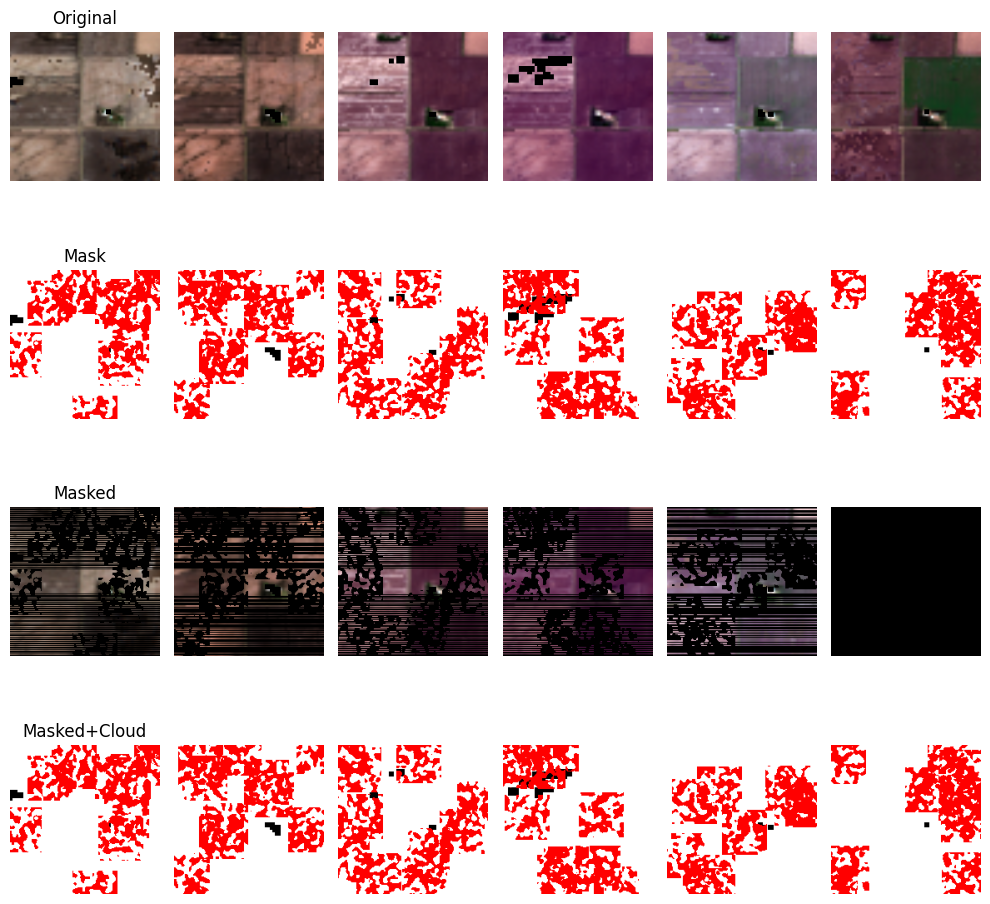

In [5]:
def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


def create_time_series_pseudo_color_image(
    multi_channel_array, cloud_mask, added_cloud_mask
):
    channel_count = 11
    if len(multi_channel_array.shape) != 3:
        raise ValueError("Input Array Shold be H W C")
    channel_list = [3, 2, 1]
    channels, h, w = multi_channel_array.shape
    time_span = int((channels - 1) / channel_count)
    images = np.split(
        multi_channel_array, [channel_count * (i + 1) for i in range(time_span)], axis=0
    )
    cloud_masks = np.split(cloud_mask, [i + 1 for i in range(time_span)], axis=0)
    added_cloud_masks = np.split(
        added_cloud_mask, [i + 1 for i in range(time_span)], axis=0
    )
    time_series_images = []
    background_cloud_images = []
    for i, image in enumerate(images):
        image = np.transpose(image, (1, 2, 0))
        pseudo_color_image = image[:, :, channel_list]
        time_series_images.append(pseudo_color_image)

        # nan_mask = np.isnan(pseudo_color_image).any(axis=-1)  # 掩码，标记 NaN 的位置

        background_cloud_image = np.full((h, w, 3), 0, dtype=np.uint8)  # ALL black
        background_cloud_image[cloud_masks[i].squeeze(0) == 1] = [
            255,
            255,
            255,
        ]  # Eecept mask white

        background_cloud_image[added_cloud_masks[i].squeeze(0) == 0] = [
            255,
            0,
            0,
        ]
        background_cloud_images.append(background_cloud_image)

    return time_series_images, background_cloud_images


def test_image_transformation(dataset, idx):

    (
        masked_kspace,
        original_image,
        cloud_mask,
        added_cloud_masks_concat,
        cls_target,
        _,
    ) = dataset[idx]
    time_series_images_original, background_cloud_images_original = (
        create_time_series_pseudo_color_image(
            original_image, cloud_mask, added_cloud_masks_concat
        )
    )
    time_series_images_masked, background_cloud_images_masked = (
        create_time_series_pseudo_color_image(
            masked_kspace, cloud_mask, added_cloud_masks_concat
        )
    )
    all_images = [
        time_series_images_original,
        background_cloud_images_original,
        time_series_images_masked,
        background_cloud_images_masked,
    ]

    fig, axes = plt.subplots(
        len(all_images), len(time_series_images_masked), figsize=(10, 10)
    )
    dict_name = {
        0: "Original",
        1: "Mask",
        2: "Masked",
        3: "Masked+Cloud",
    }
    for i, image_list in enumerate(all_images):
        for j in range(len(image_list)):
            axes[i][j].imshow(image_list[j])
            axes[i][j].axis("off")
            if j == 0:  # Add a title only to the first image of each row
                axes[i][j].set_title(dict_name[i + j])

    plt.tight_layout()
    plt.show()


idx = 18
test_image_transformation(train_dataset, idx)

In [6]:
# --------------------------------------------------------------------
# Initialising Models
# --------------------------------------------------------------------
masked_kspace, _, _, _, _, _ = train_dataset[0]
C, H, W = masked_kspace.shape

channel_count = 11
avrg_img_size = 180  # Don't change this
patch_size = 5  # 10
depth = 6
num_heads = 8
embed_dim = 64  # 64
time_span = C // channel_count
in_chans = C
epoch_max = 100
lr = 1e-4
is_SGD = False
batch_size = 20
seed = 42
if_SAR = False
num_classes = 2

current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}_reconstruction"
path = log_dir

train_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=False,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)
val_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)

torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

net = VisionTransformerTimeSeriesFormalizedWithSAR(
    avrg_img_size=avrg_img_size,
    patch_size=patch_size,
    in_chans=in_chans,
    embed_dim=embed_dim,
    depth=depth,
    num_heads=num_heads,
    is_LSA=False,  # ---------------Parameter for adding LSA component
    is_SPT=False,  # ---------------Parameter for adding SPT component
    is_CSA=False,
    rotary_position_emb=False,  # ---------------Parameter for adding ROPE component
    use_pos_embed=True,
    use_time_embed=False,
)

model = ReconNet(net).to(device)

# Set biases to zero
for name, param in model.named_parameters():
    if name.endswith(".bias"):
        torch.nn.init.constant_(param, 0)
        param.requires_grad = False

print("#Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(model)


# --------------------------------------------------------------------
# Function to Save model
# --------------------------------------------------------------------
def save_model(path, model, train_hist, optimizer, scheduler=None, epoch=None):
    if epoch is None:
        epoch = 0
    else:
        epoch = epoch + 1
    net = model.net
    if scheduler:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler": scheduler.state_dict(),
        }
    else:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
        }

    torch.save(train_hist, path + f"/train_hist_{epoch}.pt")
    torch.save(checkpoint, path + f"/checkpoint_{epoch}.pth")


"""Choose optimizer"""

# criterion = SSIMLoss_V1(window_size=11, channel=1).to(device)
# criterion = ms_ssim().to(device)
# criterion = piq.ssim().to(device)
criterion = MultiScaleLoss(scales=[1, 0.5, 0.25], weight_mse=1.0, weight_sam=1.0).to(
    device
)


if is_SGD:
    optimizerG = optim.SGD(
        model.parameters(),
        lr=lr,
        momentum=0.9,
    )
    cycle_momentum = True
    base_momentum = (0.85,)
    max_momentum = (0.95,)

else:
    optimizerG = optim.Adam(model.parameters(), lr=0.0)
    cycle_momentum = False
    base_momentum = 0.0
    max_momentum = 0.0

train_hist = []

scheduler = optim.lr_scheduler.OneCycleLR(
    optimizerG,
    max_lr=lr,
    total_steps=epoch_max,
    pct_start=0.1,
    anneal_strategy="cos",
    cycle_momentum=cycle_momentum,
    base_momentum=base_momentum,
    max_momentum=max_momentum,
    div_factor=0.1 * epoch_max,
    final_div_factor=9,
)


def check_nan_in_tensors(*tensors):
    for idx, tensor in enumerate(tensors):
        if torch.isnan(tensor).any():
            print(f"Tensor {idx} contains NaN values.")
            return True
    print("No NaN values found in the provided tensors.")
    return False

#Params: 23733722
ReconNet(
  (net): VisionTransformerTimeSeriesFormalizedWithSAR(
    (PatchDeodceTimeSeries): PatchDecodeTimeSeries(
      (deproj): ConvTranspose2d(66, 85, kernel_size=(5, 5), stride=(5, 5))
    )
    (patch_embed): PatchEmbed(
      (proj): Conv2d(66, 512, kernel_size=(5, 5), stride=(5, 5))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-5): 6 x Block(
        (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, out_features=512, bias=True)
            (1): Dropout(p=0.0, inplace=False)
          )
        )
        (temp_attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, 

Start to train the model

val_loss: 2.498474438985189, mse: 0.24541841447353363, sam: 0.9308481415112814, psnr: 6.2036794026692705, ssim: 0.010302909224682813
Epoch 1, Train loss.: 3.8833e+00
val_loss: 1.3906702200571697, mse: 0.07370499521493912, sam: 0.5068597396214803, psnr: 11.50929037729899, ssim: 0.037199276540678526


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.43302813..1.1613733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.37731132..1.4264653].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6132535..1.2079176].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6090821..1.3855311].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45530376..1.1466852].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48938727..1.1898539].


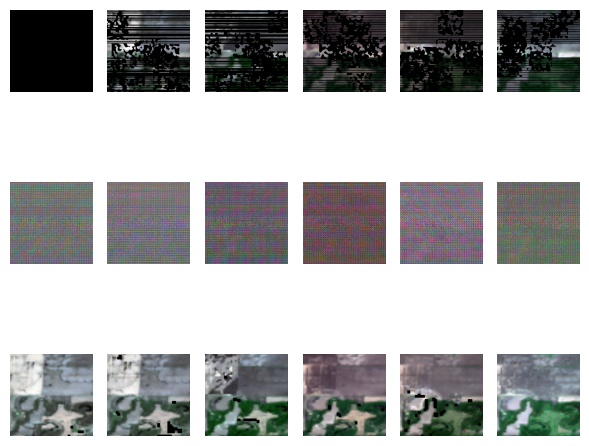

Epoch 2, Train loss.: 1.9176e+00
val_loss: 1.0628968079884846, mse: 0.03852120290199915, sam: 0.3470660249392192, psnr: 14.448231061299643, ssim: 0.13862470011081263
Epoch 3, Train loss.: 1.2706e+00
val_loss: 0.9050618410110474, mse: 0.03177833495040735, sam: 0.3039728303750356, psnr: 15.306157430013021, ssim: 0.17174687212127146


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14743124..0.876458].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24235763..0.9818318].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2752032..0.83661944].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32796136..0.8464073].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49077415..0.91653544].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41319403..0.8207245].


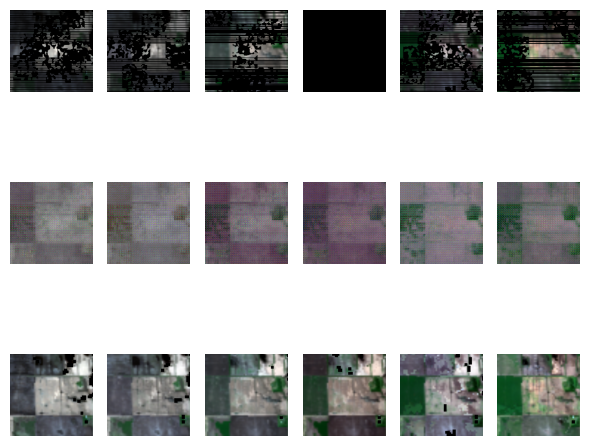

Epoch 4, Train loss.: 1.1042e+00
val_loss: 0.8407012621561686, mse: 0.02660418798526128, sam: 0.27734191219011944, psnr: 16.10723050435384, ssim: 0.21957270591884126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043985143..0.92372763].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056975137..0.9304267].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0926675..0.82078475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.097285785..0.7721897].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16842501..0.81289124].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17482726..0.76775074].


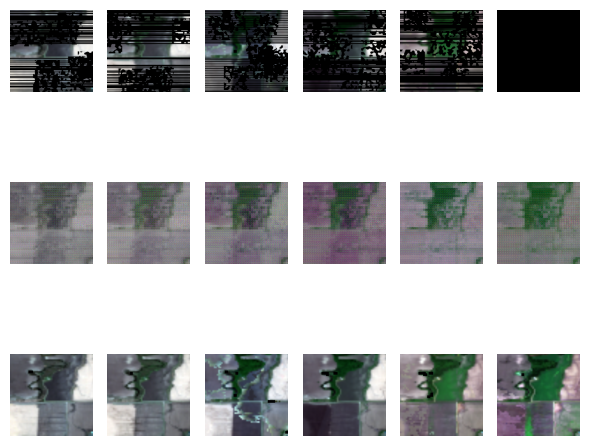

Epoch 5, Train loss.: 1.0029e+00
Model saved at epoch 5
val_loss: 0.7724951108296713, mse: 0.02318880893290043, sam: 0.25083743532498676, psnr: 16.777005513509113, ssim: 0.2765805197036311


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13028283..0.7669926].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17299439..0.70705914].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22718991..0.66128063].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23535703..0.5772289].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.33523622..0.69947875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.25092924..0.61339664].


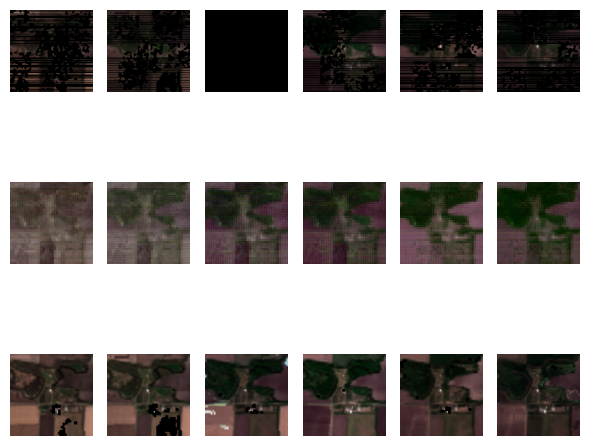

Epoch 6, Train loss.: 9.6366e-01
val_loss: 0.7685847878456116, mse: 0.021800451601545017, sam: 0.25096554557482403, psnr: 17.062401453653973, ssim: 0.27896342378339667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009007542..0.97795767].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026639745..0.9527339].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10670065..0.8179381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10339542..0.8152212].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12858087..0.7834017].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15174551..0.7697216].


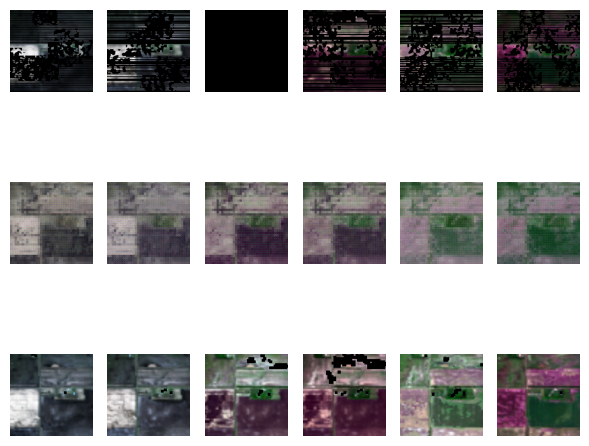

Epoch 7, Train loss.: 9.1456e-01
val_loss: 0.7273640831311544, mse: 0.01996571198105812, sam: 0.23550313711166382, psnr: 17.45580228169759, ssim: 0.315637026919371
Epoch 8, Train loss.: 8.9437e-01
val_loss: 0.7018314798672994, mse: 0.019003237908085186, sam: 0.22838722169399261, psnr: 17.65814781188965, ssim: 0.32343109888017124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.079747945..0.83175635].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10037132..0.83146363].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08021305..0.83435833].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.120293766..0.78204066].


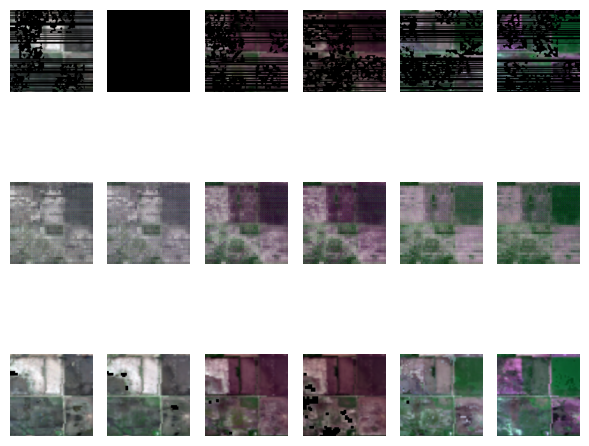

Epoch 9, Train loss.: 8.5935e-01
val_loss: 0.6890250245730082, mse: 0.01873834989964962, sam: 0.2232586940129598, psnr: 17.707455317179363, ssim: 0.33965411194956613
Epoch 10, Train loss.: 8.4093e-01
Model saved at epoch 10
val_loss: 0.6809646884600321, mse: 0.01810220442712307, sam: 0.2198326587677002, psnr: 17.863287607828777, ssim: 0.35263485626607793


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09557843..0.724167].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13138117..0.75934416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15794729..0.8299996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055207357..0.7480617].


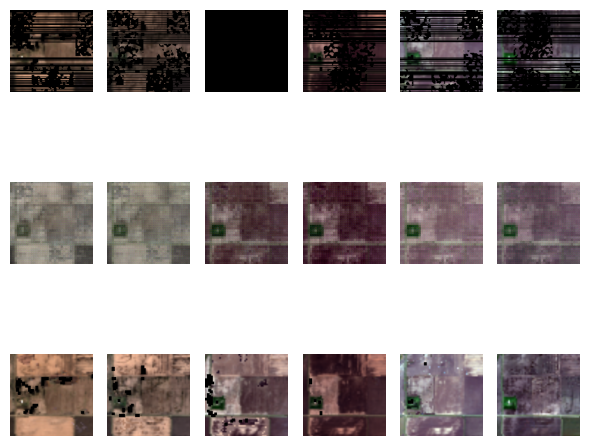

Epoch 11, Train loss.: 8.2560e-01
val_loss: 0.6814151008923849, mse: 0.01763340209921201, sam: 0.2192952185869217, psnr: 18.05297597249349, ssim: 0.37383698961572026


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05330181..0.833702].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053234927..0.74269545].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.071544886..0.7868887].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05994955..0.71855253].


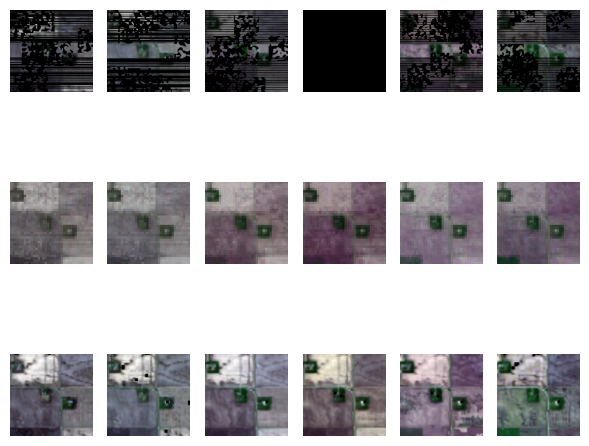

Epoch 12, Train loss.: 8.0811e-01
val_loss: 0.6552414298057556, mse: 0.016487594073017437, sam: 0.21255389352639517, psnr: 18.303850173950195, ssim: 0.37627023333328014


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08236652..0.84985423].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.069913775..0.82304794].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12035745..0.7978943].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09063252..0.72500205].


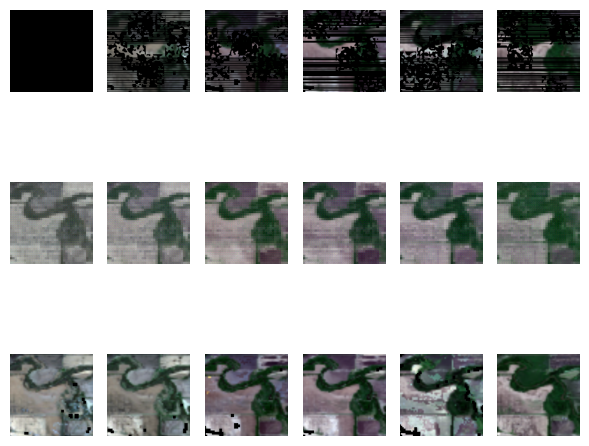

Epoch 13, Train loss.: 8.0811e-01
val_loss: 0.6422488292058309, mse: 0.01610393760104974, sam: 0.20906353990236917, psnr: 18.435807545979817, ssim: 0.3810510062668371


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16107303..0.82701135].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.116474815..0.82619554].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.091761775..0.82271177].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060502246..0.7855029].


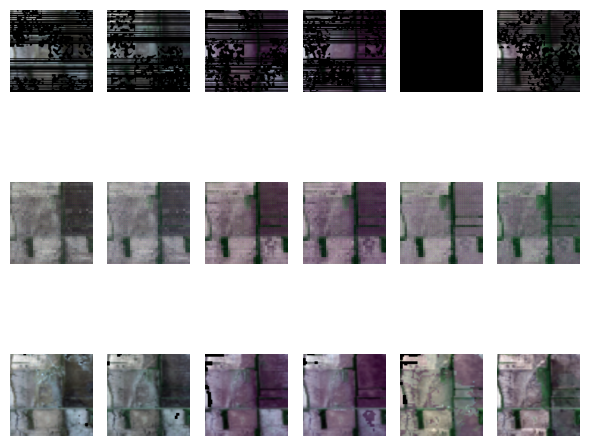

Epoch 14, Train loss.: 7.8769e-01
val_loss: 0.6475916902224222, mse: 0.01581697662671407, sam: 0.21081930895646414, psnr: 18.47779655456543, ssim: 0.38963613888434384


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0332045..0.75664204].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057226446..0.7357265].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0019519984..0.6256709].


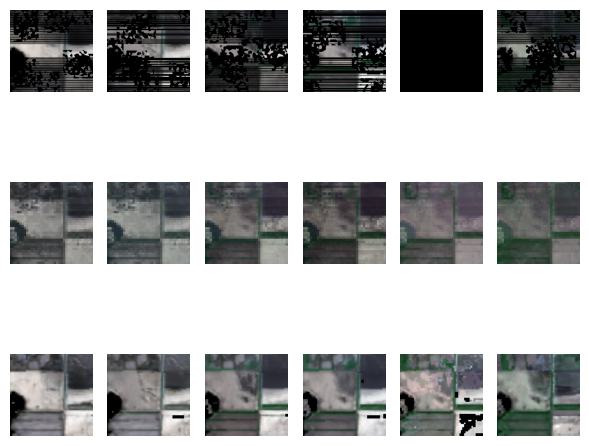

Epoch 15, Train loss.: 7.7797e-01
Model saved at epoch 15
val_loss: 0.6213270425796509, mse: 0.01523119987299045, sam: 0.20226641496022543, psnr: 18.673669815063477, ssim: 0.40158679037418527
Epoch 16, Train loss.: 7.7547e-01
val_loss: 0.6264764865239462, mse: 0.015064327356715998, sam: 0.20395886898040771, psnr: 18.734931310017902, ssim: 0.4048494182023634


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.099303626..0.83716273].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08030069..0.96675897].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005298845..1.026887].


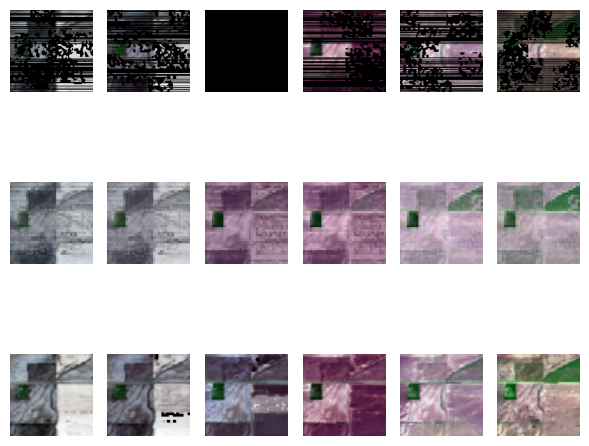

Epoch 17, Train loss.: 7.5763e-01
val_loss: 0.6181003650029501, mse: 0.014721046822766462, sam: 0.20157734553019205, psnr: 18.846524556477863, ssim: 0.4055960049199536
Epoch 18, Train loss.: 7.4992e-01
val_loss: 0.6117969751358032, mse: 0.014306508315106234, sam: 0.19972998897234598, psnr: 18.924649556477863, ssim: 0.4048244087576644


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04647952..0.7733101].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.111916..0.723835].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1446763..0.6353658].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09571243..0.60004437].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17385383..0.633547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1765907..0.5304641].


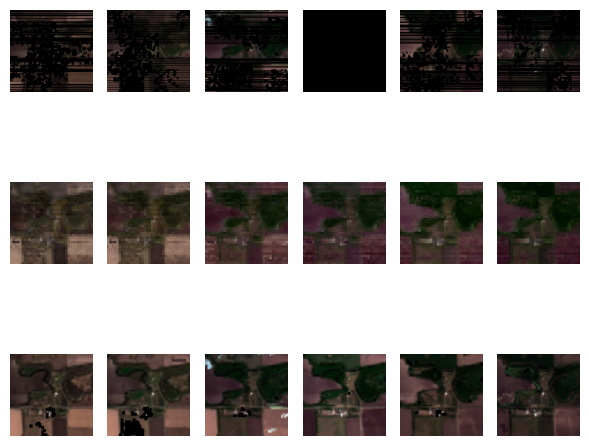

Epoch 19, Train loss.: 7.4436e-01
val_loss: 0.601652463277181, mse: 0.013727793470025063, sam: 0.19602063298225403, psnr: 19.118113835652668, ssim: 0.4250564058875255


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03310497..1.0040643].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047615986..0.8048941].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056376737..0.8144071].


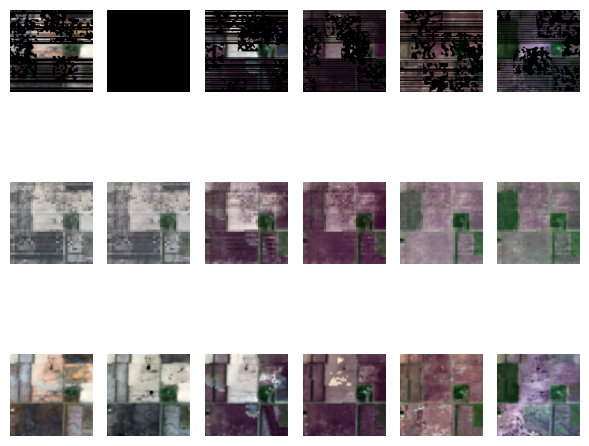

Epoch 20, Train loss.: 7.3734e-01
Model saved at epoch 20
val_loss: 0.5986274679501852, mse: 0.013421488925814629, sam: 0.19567120571931204, psnr: 19.22541872660319, ssim: 0.4281006401873378


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1514618..1.00288].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16611633..1.0093293].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021587094..0.8351134].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029593864..0.8049567].


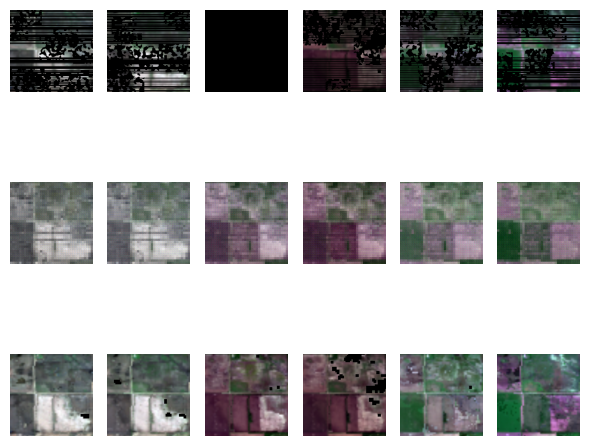

Epoch 21, Train loss.: 7.2946e-01
val_loss: 0.5861524740854899, mse: 0.013105662539601326, sam: 0.19217465817928314, psnr: 19.279865264892578, ssim: 0.42788721564775295


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035139233..0.9779774].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.003886421..0.98172617].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.012110624..0.95064163].


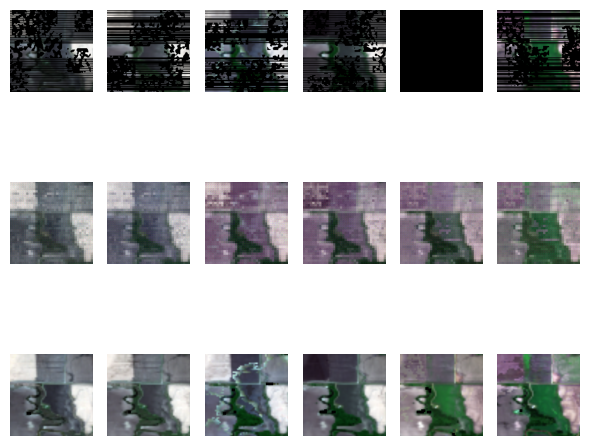

Epoch 22, Train loss.: 7.2412e-01
val_loss: 0.5765759348869324, mse: 0.01283096925665935, sam: 0.18859629333019257, psnr: 19.40570131937663, ssim: 0.4371791432338256
Epoch 23, Train loss.: 7.1796e-01
val_loss: 0.5832176407178243, mse: 0.013393375712136427, sam: 0.19002856810887656, psnr: 19.26158905029297, ssim: 0.43204510571085947
Epoch 24, Train loss.: 7.1154e-01
val_loss: 0.5759727557500204, mse: 0.012907811750968298, sam: 0.18789332608381906, psnr: 19.347911834716797, ssim: 0.44148049126885636
Epoch 25, Train loss.: 7.0660e-01
Model saved at epoch 25
val_loss: 0.5800382693608602, mse: 0.012454033829271793, sam: 0.18940944969654083, psnr: 19.598915735880535, ssim: 0.44711292726123064
Epoch 26, Train loss.: 7.0825e-01
val_loss: 0.5582925279935201, mse: 0.011539500206708908, sam: 0.18361533681551614, psnr: 19.8337828318278, ssim: 0.454554597463426


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.074251786..0.9422962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056168355..0.90728766].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03200323..0.7779379].


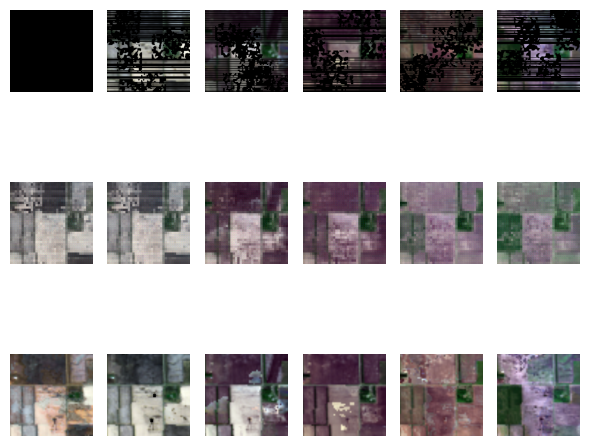

Epoch 27, Train loss.: 6.9754e-01
val_loss: 0.5685214400291443, mse: 0.012038180294136206, sam: 0.18605763713518778, psnr: 19.725937525431316, ssim: 0.4570856351727342


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036713462..0.8469939].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04051864..0.7610008].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09744201..0.48614314].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04060619..0.4840377].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10064401..0.6387596].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.121532224..0.65406984].


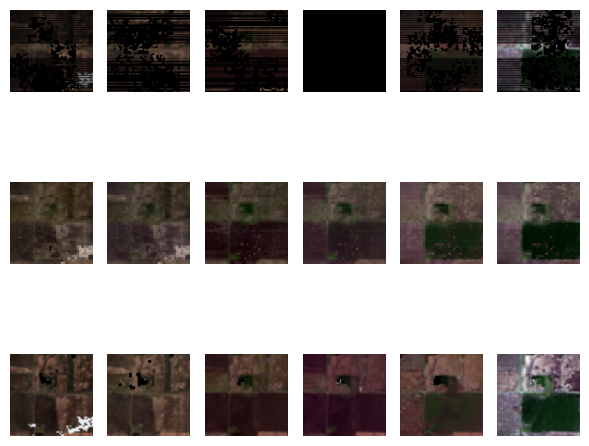

Epoch 28, Train loss.: 6.8908e-01
val_loss: 0.5604637066523234, mse: 0.011639112296203772, sam: 0.18341433008511862, psnr: 19.844367345174152, ssim: 0.46652783153708005


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05843325..0.7569774].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.094481274..0.7932118].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14548437..0.86537313].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06418302..0.754688].


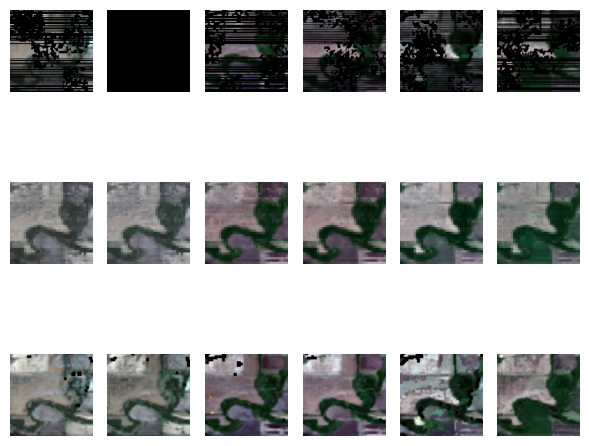

Epoch 29, Train loss.: 6.8895e-01
val_loss: 0.545002818107605, mse: 0.011218410606185595, sam: 0.17867517471313477, psnr: 20.014610926310223, ssim: 0.47276094165801585
Epoch 30, Train loss.: 6.8311e-01
Model saved at epoch 30
val_loss: 0.5541441241900126, mse: 0.011129757389426231, sam: 0.18173491458098093, psnr: 20.047335942586262, ssim: 0.4713898426311858
Epoch 31, Train loss.: 6.7709e-01
val_loss: 0.530967116355896, mse: 0.010858312249183655, sam: 0.1742494801680247, psnr: 20.11571439107259, ssim: 0.47526279682954126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028129954..0.9422599].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011166367..0.83228046].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10232608..0.8703508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06977341..0.82068896].


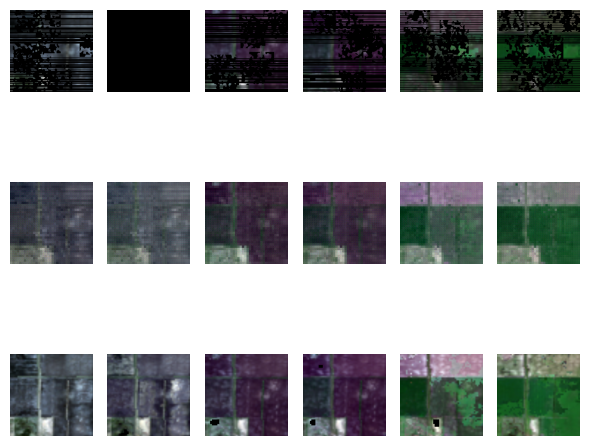

Epoch 32, Train loss.: 6.7196e-01
val_loss: 0.5296885768572489, mse: 0.010433651196459929, sam: 0.17393382887045541, psnr: 20.366837819417317, ssim: 0.4927906426492716


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11753954..1.0087628].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034916874..0.83742654].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.040272314..0.8107988].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062029477..0.8604482].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035018537..0.7759928].


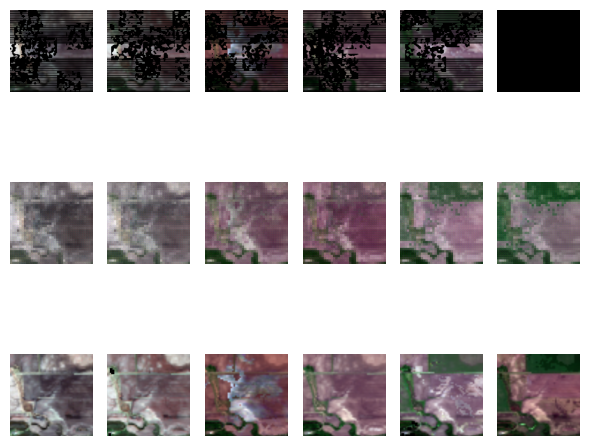

Epoch 33, Train loss.: 6.7504e-01
val_loss: 0.5470913052558899, mse: 0.010889623003701368, sam: 0.17948939899603525, psnr: 20.230727513631184, ssim: 0.48566018415792994


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03324344..1.0290318].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05842763..1.0233369].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06980615..0.9164362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.088059746..0.8289257].


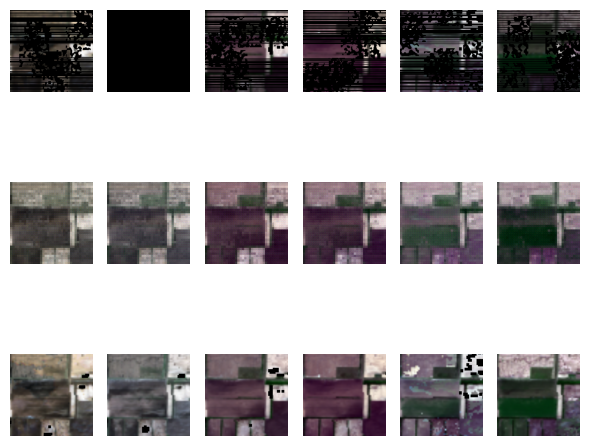

Epoch 34, Train loss.: 6.6511e-01
val_loss: 0.5300314823786417, mse: 0.010414638246099154, sam: 0.17445233464241028, psnr: 20.386414845784504, ssim: 0.4918436981046139
Epoch 35, Train loss.: 6.7394e-01
Model saved at epoch 35
val_loss: 0.5283984939257304, mse: 0.010183876069883505, sam: 0.17340960601965585, psnr: 20.46091079711914, ssim: 0.49792401231301603
Epoch 36, Train loss.: 6.6532e-01
val_loss: 0.5176712274551392, mse: 0.009927745287617048, sam: 0.1705148865779241, psnr: 20.558483123779297, ssim: 0.4983045569284996
Epoch 37, Train loss.: 6.5795e-01
val_loss: 0.5398722092310587, mse: 0.0104762502014637, sam: 0.17721805473168692, psnr: 20.365158716837566, ssim: 0.49300421898689883


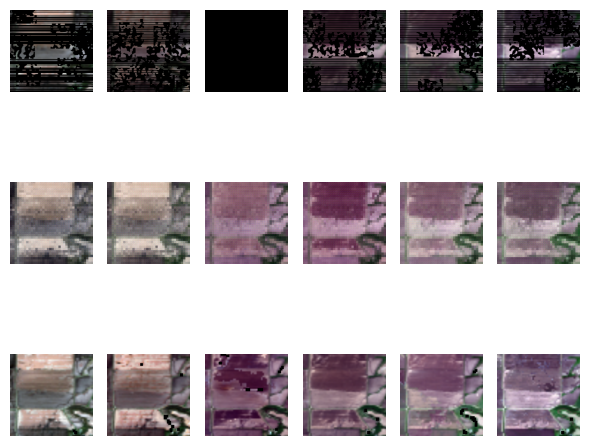

Epoch 38, Train loss.: 6.6364e-01
val_loss: 0.531890352567037, mse: 0.009988192468881607, sam: 0.1747918725013733, psnr: 20.53868293762207, ssim: 0.5006323242950087


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00042535775..0.8593825].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034160547..0.8214022].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020380158..0.7382136].


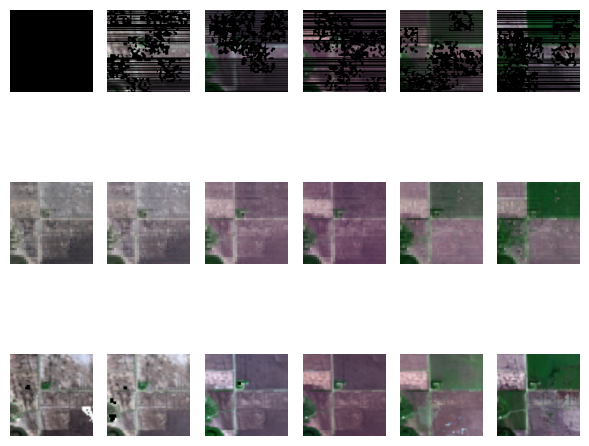

Epoch 39, Train loss.: 6.5271e-01
val_loss: 0.5365681250890096, mse: 0.010126306675374508, sam: 0.17620343963305155, psnr: 20.48016103108724, ssim: 0.4984257784286336


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015418499..0.82583374].


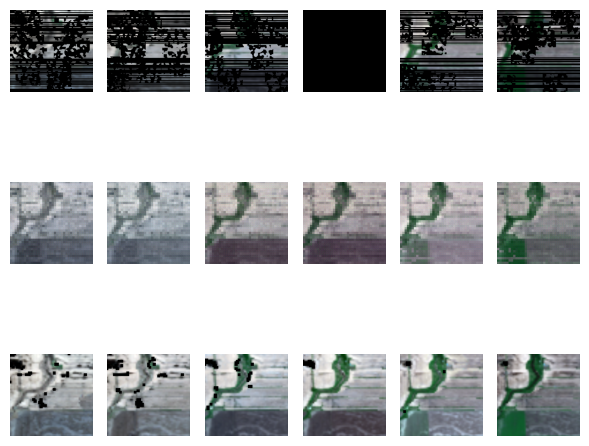

Epoch 40, Train loss.: 6.5769e-01
Model saved at epoch 40
val_loss: 0.5144578218460083, mse: 0.009509917969504992, sam: 0.16931147376696268, psnr: 20.770407994588215, ssim: 0.5114601663021036


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025969697..0.9263272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021037223..0.81350166].


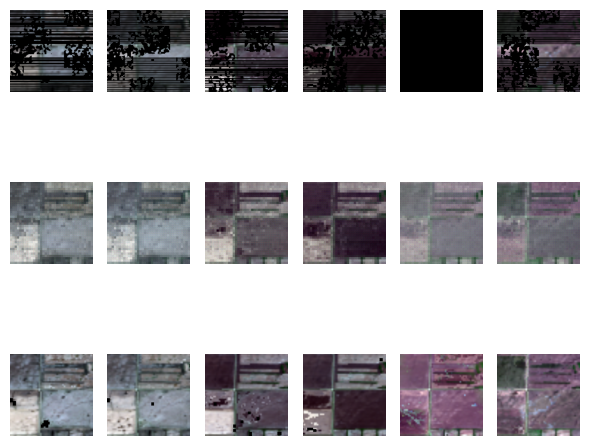

Epoch 41, Train loss.: 6.4526e-01
val_loss: 0.5134166479110718, mse: 0.009589808682600657, sam: 0.16898049910863241, psnr: 20.724908192952473, ssim: 0.5122365266961805


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020395514..1.0315862].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0693798..1.006763].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.019024845..0.82908773].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0012213847..0.777405].


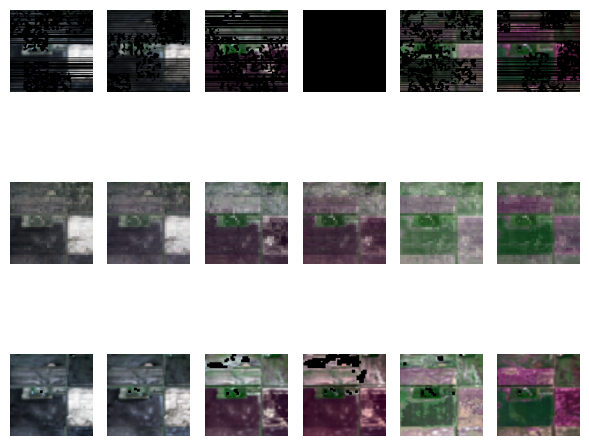

Epoch 42, Train loss.: 6.4246e-01
val_loss: 0.5139108498891195, mse: 0.009638771725197634, sam: 0.16891038417816162, psnr: 20.713377634684246, ssim: 0.5042251398353197
Epoch 43, Train loss.: 6.4302e-01
val_loss: 0.5172978440920512, mse: 0.00975712575018406, sam: 0.16991924742857614, psnr: 20.673783620198567, ssim: 0.5098359156449271
Epoch 44, Train loss.: 6.3678e-01
val_loss: 0.4937499264876048, mse: 0.009130701422691345, sam: 0.1626735726992289, psnr: 20.89414914449056, ssim: 0.5189032175310269
Epoch 45, Train loss.: 6.3566e-01
Model saved at epoch 45
val_loss: 0.5126076936721802, mse: 0.009479887162645658, sam: 0.16835526128609976, psnr: 20.844585418701172, ssim: 0.5220378922099476
Epoch 46, Train loss.: 6.3195e-01
val_loss: 0.508401999870936, mse: 0.009292774212857088, sam: 0.16735771795113882, psnr: 20.976952870686848, ssim: 0.5150822229448515


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.060644783..1.0028801].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022938097..0.87201506].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042104296..0.90624094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044479202..0.9632778].


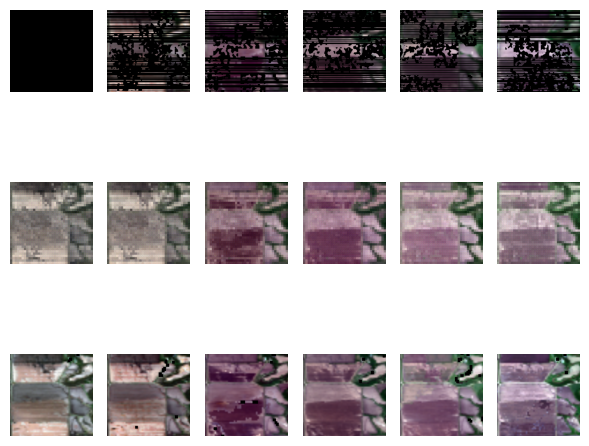

Epoch 47, Train loss.: 6.2985e-01
val_loss: 0.5020887951056162, mse: 0.009186864209671816, sam: 0.16504794359207153, psnr: 20.88644790649414, ssim: 0.5173411801957976


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006428375..0.89853144].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02889918..0.97171307].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006226484..0.9827387].


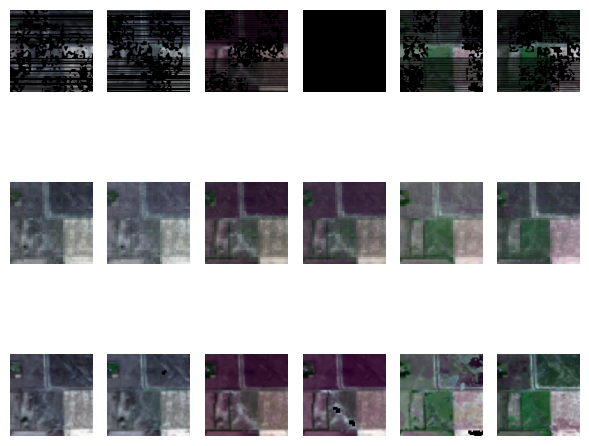

Epoch 48, Train loss.: 6.2839e-01
val_loss: 0.4972062309583028, mse: 0.008661446472009024, sam: 0.16410200794537863, psnr: 21.22353744506836, ssim: 0.5275085387012431


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010256107..0.9142647].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023315305..0.8814641].


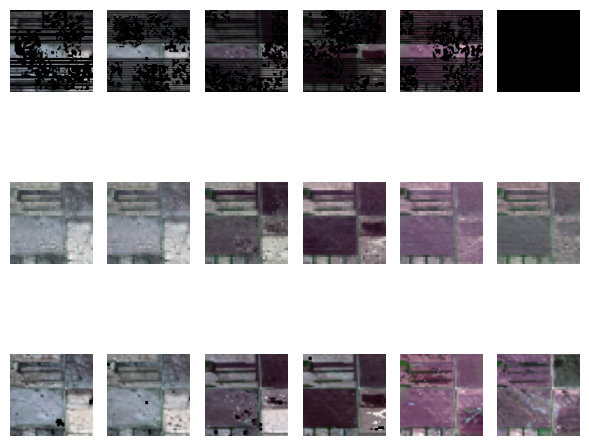

Epoch 49, Train loss.: 6.2463e-01
val_loss: 0.4969737728436788, mse: 0.009091081408162912, sam: 0.1639905571937561, psnr: 20.97180684407552, ssim: 0.5148081076929055


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03489223..1.0085975].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06477065..0.9175275].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.071669064..1.0035788].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07417418..0.9758001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.054880798..0.9028369].


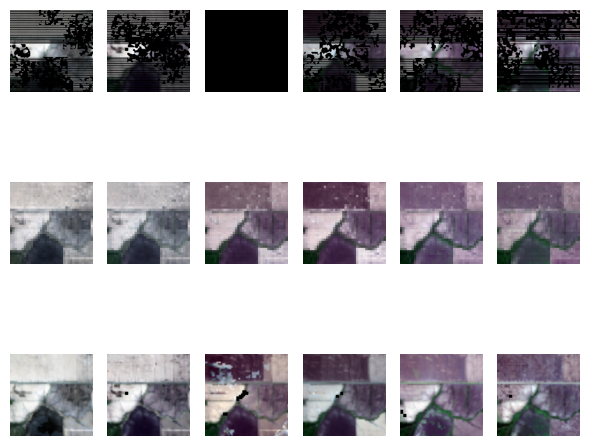

Epoch 50, Train loss.: 6.2291e-01
Model saved at epoch 50
val_loss: 0.4887675146261851, mse: 0.008539076273639997, sam: 0.16138899823029837, psnr: 21.23909060160319, ssim: 0.5296599837486797


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020572912..0.87682545].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026499966..0.8914384].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.038489297..0.7775979].


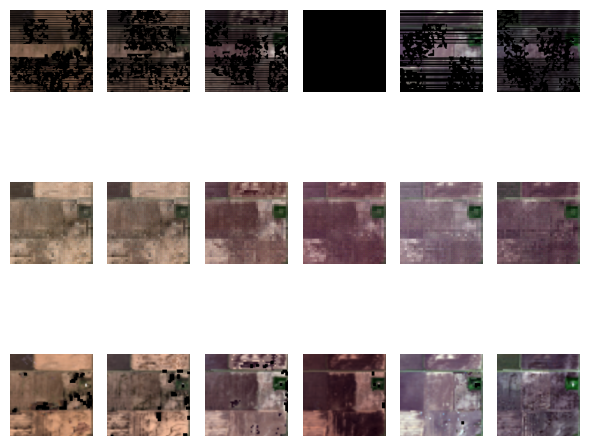

Epoch 51, Train loss.: 6.1987e-01
val_loss: 0.4863147735595703, mse: 0.00876943115144968, sam: 0.16016557812690735, psnr: 21.1163387298584, ssim: 0.5262301283822916
Epoch 52, Train loss.: 6.1915e-01
val_loss: 0.48388450344403583, mse: 0.008498040648798147, sam: 0.15982518593470255, psnr: 21.20992088317871, ssim: 0.5328721564064725


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06110793..1.0641899].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.066556945..1.072239].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005648234..0.8807908].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026374366..0.8715637].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.075209685..0.6249855].


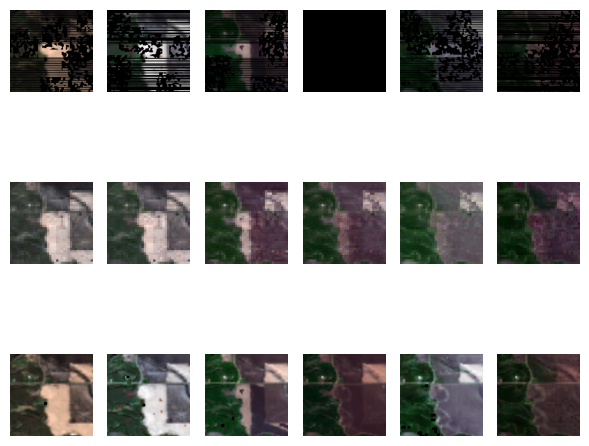

Epoch 53, Train loss.: 6.2075e-01
val_loss: 0.4812883536020915, mse: 0.008411004208028316, sam: 0.15903690457344055, psnr: 21.320311228434246, ssim: 0.535603064546167
Epoch 54, Train loss.: 6.1801e-01
val_loss: 0.4819439152876536, mse: 0.008301930812497934, sam: 0.15946081280708313, psnr: 21.420857111612957, ssim: 0.5388758944357024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07297059..1.0568905].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.119886406..0.93292725].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12303823..1.0123239].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052262876..0.9906614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025010105..0.9948431].


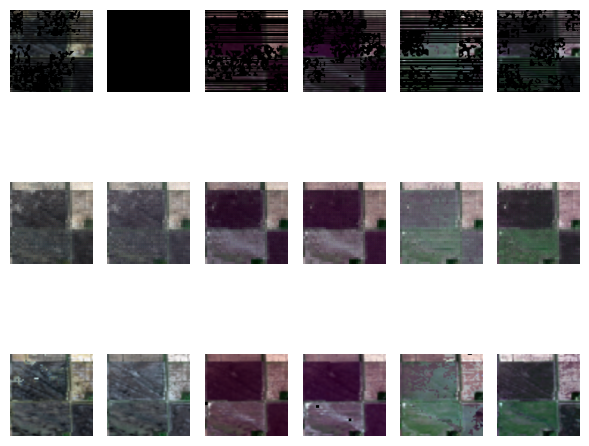

Epoch 55, Train loss.: 6.1454e-01
Model saved at epoch 55
val_loss: 0.49092593789100647, mse: 0.008673029330869516, sam: 0.16183464725812277, psnr: 21.21494483947754, ssim: 0.5310531669931108
Epoch 56, Train loss.: 6.1404e-01
val_loss: 0.483772337436676, mse: 0.00854764599353075, sam: 0.15960791210333505, psnr: 21.275943756103516, ssim: 0.5327838062870901


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0800694..1.0515978].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.019072495..0.97570056].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00269065..1.0542786].


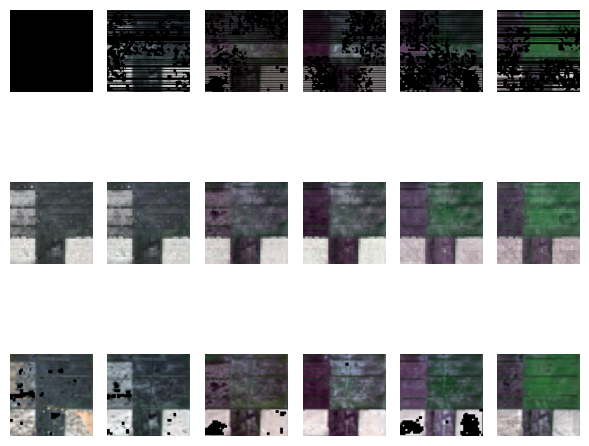

Epoch 57, Train loss.: 6.0948e-01
val_loss: 0.4725343585014343, mse: 0.008043407928198576, sam: 0.1562255322933197, psnr: 21.475690841674805, ssim: 0.539239228490505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03779409..0.91996026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06349653..1.0140096].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0069979904..0.9871925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011873526..0.91619104].


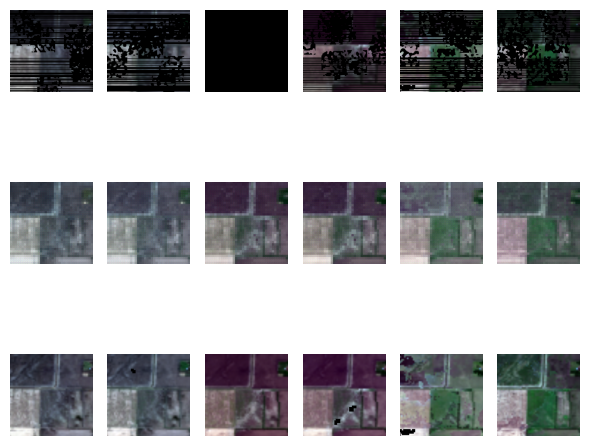

Epoch 58, Train loss.: 6.0896e-01
val_loss: 0.4734391172726949, mse: 0.008203040187557539, sam: 0.15682890514532724, psnr: 21.416339874267578, ssim: 0.5342585263446163
Epoch 59, Train loss.: 6.1475e-01
val_loss: 0.47341859340667725, mse: 0.008243169635534286, sam: 0.15648133059342703, psnr: 21.396719614664715, ssim: 0.5329155550706024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048501574..0.8879258].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023890851..0.7685817].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12945735..0.7953154].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060930897..0.7301881].


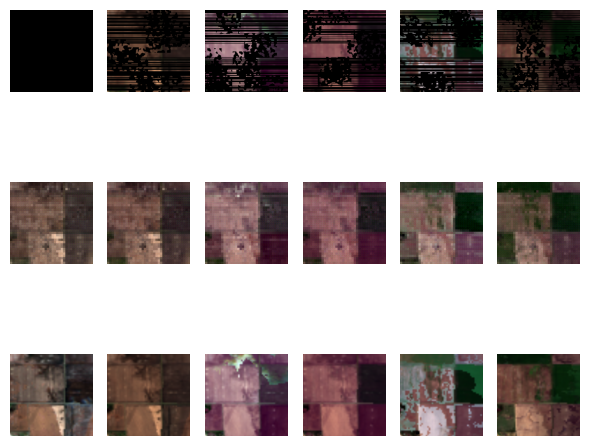

Epoch 60, Train loss.: 6.0714e-01
Model saved at epoch 60
val_loss: 0.4756181438763936, mse: 0.008022581537564596, sam: 0.15711514155069986, psnr: 21.51480229695638, ssim: 0.5400791175042323
Epoch 61, Train loss.: 6.1170e-01
val_loss: 0.4702701171239217, mse: 0.0077608961922427016, sam: 0.15577984352906546, psnr: 21.613314310709637, ssim: 0.5451550752942597


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12288085..1.085931].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07914636..1.0963643].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021202086..1.0260923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045369696..0.8164989].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027127393..0.9429829].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.054216072..0.6890215].


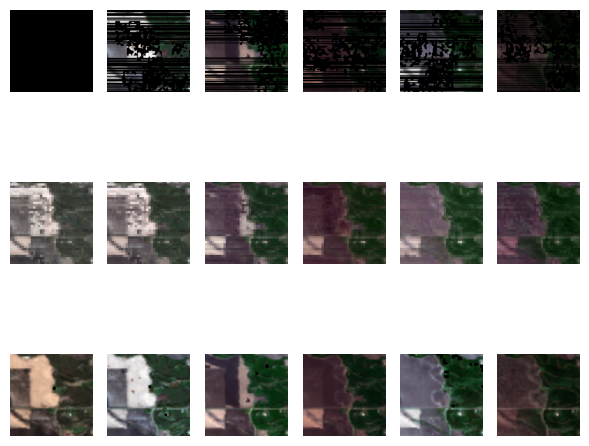

Epoch 62, Train loss.: 6.0354e-01
val_loss: 0.4712153474489848, mse: 0.007892101692656675, sam: 0.15614022314548492, psnr: 21.640735626220703, ssim: 0.5484594151369667


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031921413..1.0718485].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.061344065..1.017148].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035502326..0.94977516].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058566295..0.9934237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031122737..0.9898304].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0294117..0.83162856].


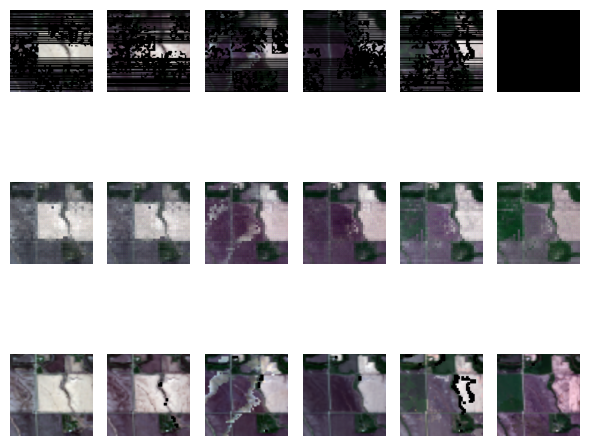

Epoch 63, Train loss.: 6.0215e-01
val_loss: 0.4691644012928009, mse: 0.007984349659333626, sam: 0.1553143858909607, psnr: 21.526875813802082, ssim: 0.5381971566659226


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018930072..0.9994135].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09091974..0.9984422].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08694046..0.93466014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081312716..0.99707156].


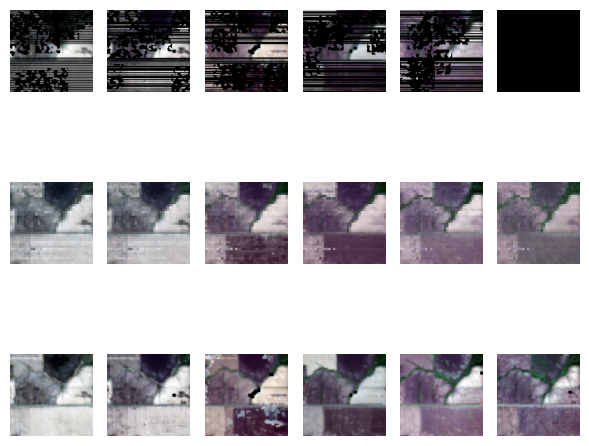

Epoch 64, Train loss.: 5.9882e-01
val_loss: 0.4783694346745809, mse: 0.00806684885174036, sam: 0.15782085557778677, psnr: 21.658865610758465, ssim: 0.5520064144867282
Epoch 65, Train loss.: 5.9833e-01
Model saved at epoch 65
val_loss: 0.47350358963012695, mse: 0.008110824972391129, sam: 0.15619644025961557, psnr: 21.60487111409505, ssim: 0.550831915877381


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04191394..1.0133402].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030808501..0.7985982].


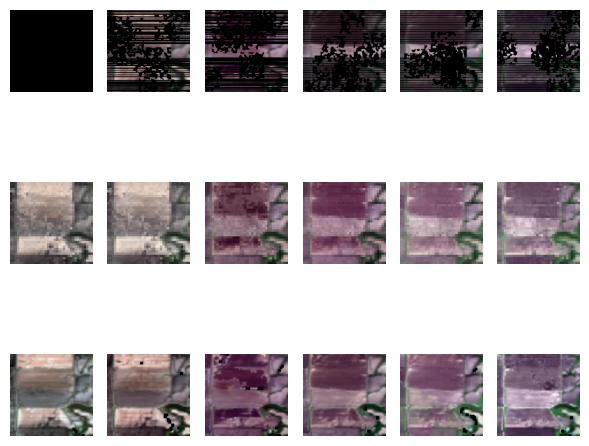

Epoch 66, Train loss.: 5.9873e-01
val_loss: 0.4638822873433431, mse: 0.007673673176517089, sam: 0.15356788039207458, psnr: 21.713390986124676, ssim: 0.5503047233316006
Epoch 67, Train loss.: 5.9507e-01
val_loss: 0.46735050280888873, mse: 0.007795863940070073, sam: 0.15492072204748789, psnr: 21.68164316813151, ssim: 0.5413751526076829


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00524992..0.8422383].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07086006..0.8209962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1000772..0.8430878].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03967031..0.6336999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.085972816..0.6306453].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09987159..0.6565329].


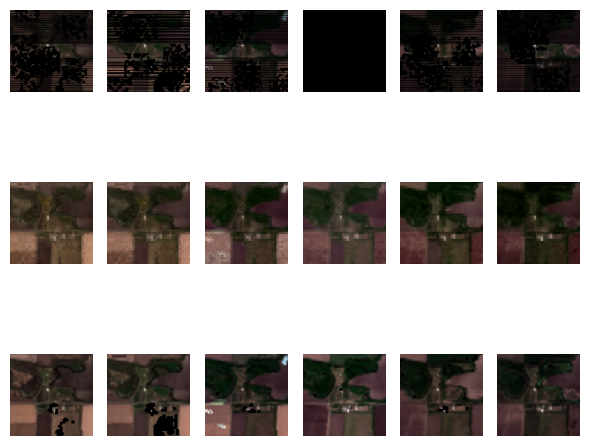

Epoch 68, Train loss.: 5.9452e-01
val_loss: 0.46668529510498047, mse: 0.007675443155070146, sam: 0.1546622415383657, psnr: 21.755202611287434, ssim: 0.5494235010527787


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021219417..1.0999252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.060899694..1.1351491].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00076345535..1.1125625].


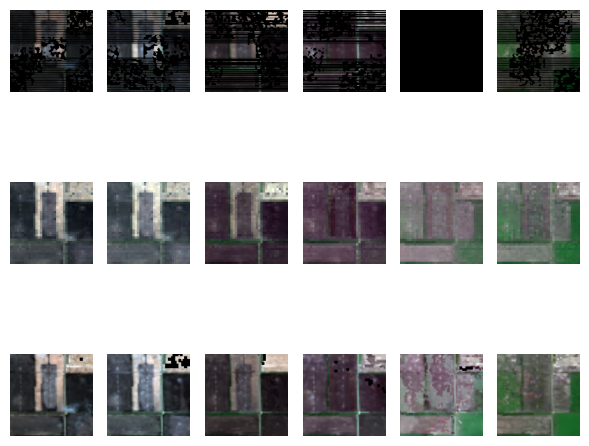

Epoch 69, Train loss.: 5.9078e-01
val_loss: 0.4605742891629537, mse: 0.007912449383487305, sam: 0.15229437251885733, psnr: 21.626347223917644, ssim: 0.548215827802656


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.111920424..0.8768304].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081495..0.8734556].


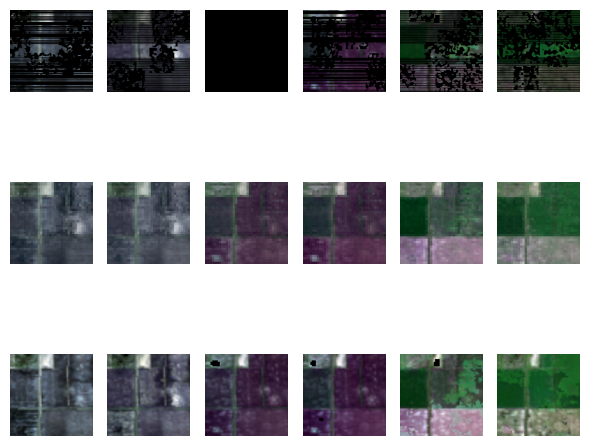

Epoch 70, Train loss.: 6.0247e-01
Model saved at epoch 70
val_loss: 0.4662691652774811, mse: 0.007427719887346029, sam: 0.1548945109049479, psnr: 21.935504913330078, ssim: 0.5522208754371515
Epoch 71, Train loss.: 5.8903e-01
val_loss: 0.4624927838643392, mse: 0.007476272527128458, sam: 0.15356720983982086, psnr: 21.923625310262043, ssim: 0.5553418677988077


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07637216..0.6476769].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057034712..0.6293579].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05267843..0.7686918].


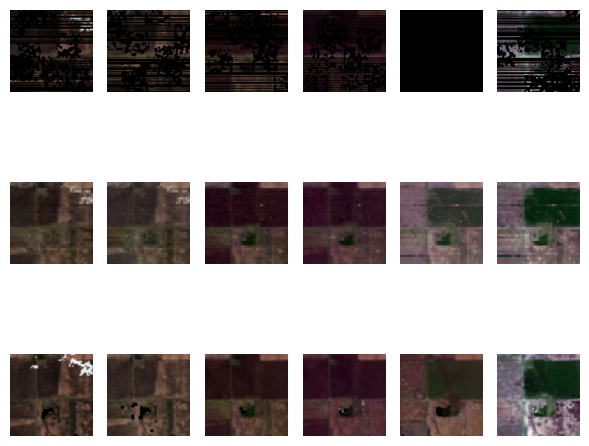

Epoch 72, Train loss.: 5.9480e-01
val_loss: 0.45795324444770813, mse: 0.0075793649690846605, sam: 0.15189285079638162, psnr: 21.750755310058594, ssim: 0.5503992872215034
Epoch 73, Train loss.: 5.8874e-01
val_loss: 0.4554329216480255, mse: 0.00750346885373195, sam: 0.15101835628350577, psnr: 21.803974151611328, ssim: 0.5539846413928468


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030916946..0.67570555].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.054301906..0.6368508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060511492..0.59076524].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015106134..0.71505547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056082074..0.7589192].


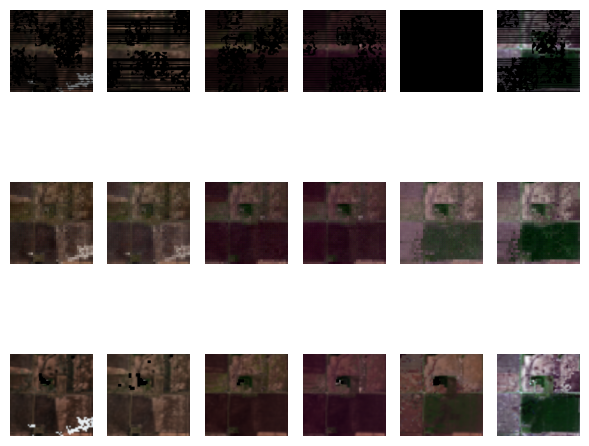

Epoch 74, Train loss.: 5.8834e-01
val_loss: 0.461615910132726, mse: 0.007565950353940328, sam: 0.15300933023293814, psnr: 21.909387588500977, ssim: 0.5574000828310769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08917638..1.0113403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052887626..1.051216].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043113086..1.0574642].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0132936835..0.90254456].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023737572..0.8868402].


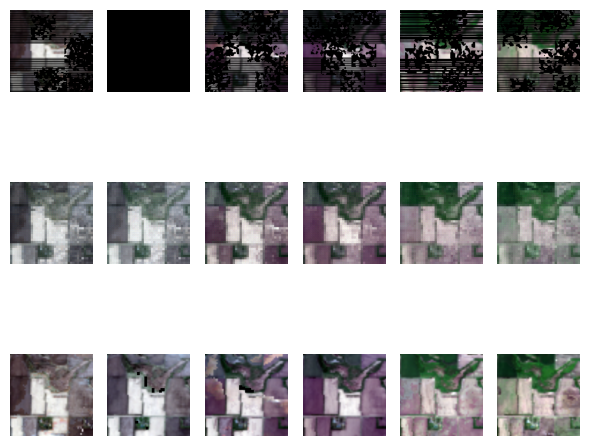

Epoch 75, Train loss.: 5.8608e-01
Model saved at epoch 75
val_loss: 0.45317134261131287, mse: 0.0073409501152733965, sam: 0.15052236119906107, psnr: 21.932139078776043, ssim: 0.5575137647830885


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05138221..1.105514].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0012597926..1.0388105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034576833..1.0467938].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055750206..1.0382781].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06844507..0.9190676].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018728018..0.8065577].


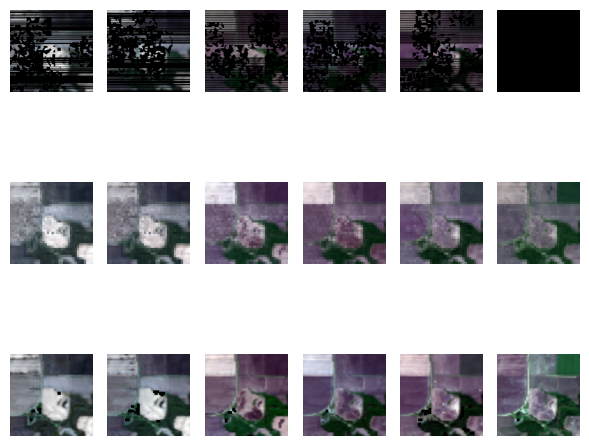

Epoch 76, Train loss.: 5.8638e-01
val_loss: 0.45016251007715863, mse: 0.007551059126853943, sam: 0.149155060450236, psnr: 21.83449363708496, ssim: 0.5528856421153153
Epoch 77, Train loss.: 5.9400e-01
val_loss: 0.4549368619918823, mse: 0.0072427294217050076, sam: 0.1511289874712626, psnr: 22.02538998921712, ssim: 0.5561357384218834


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05474903..1.0006561].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07477771..0.85357237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045451898..0.90366787].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0061273575..0.8235324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042456638..0.75811493].


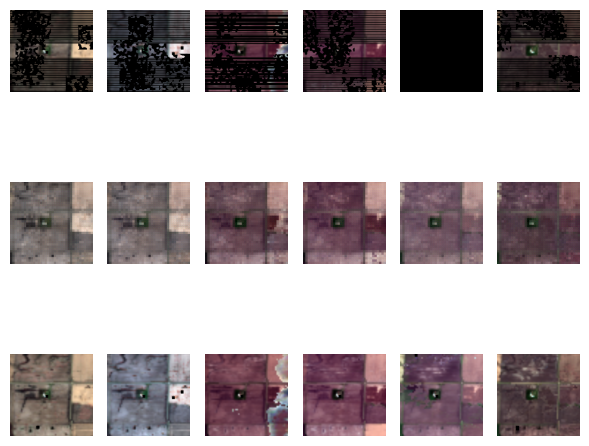

Epoch 78, Train loss.: 5.8083e-01
val_loss: 0.4617166618506114, mse: 0.007561968794713418, sam: 0.15303472677866617, psnr: 21.8749205271403, ssim: 0.5551355153347339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07482588..1.0465708].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.066494375..1.0250793].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034053117..1.0114632].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03893564..0.93179196].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0065173316..0.9281587].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024929868..0.8934116].


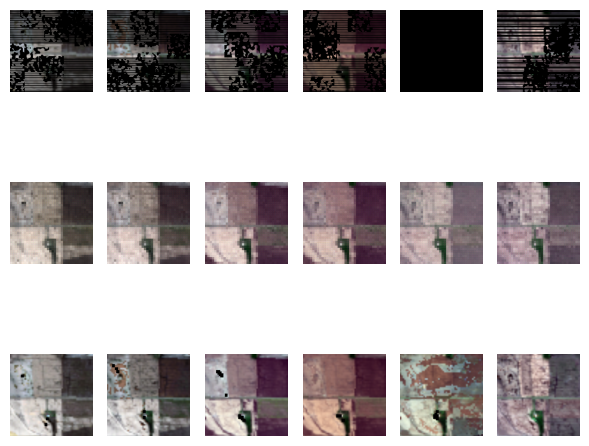

Epoch 79, Train loss.: 5.8225e-01
val_loss: 0.4536838134129842, mse: 0.007432500831782818, sam: 0.15053090949853262, psnr: 21.89401372273763, ssim: 0.5548509697333125
Epoch 80, Train loss.: 5.8174e-01
Model saved at epoch 80
val_loss: 0.448133518298467, mse: 0.00752824575950702, sam: 0.14867969850699106, psnr: 21.84105682373047, ssim: 0.552404508131539
Epoch 81, Train loss.: 5.8254e-01
val_loss: 0.4533430238564809, mse: 0.00745141739025712, sam: 0.15032934645811716, psnr: 21.85772196451823, ssim: 0.5541765065393413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08046015..1.0091202].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057754546..1.0298426].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029190488..0.894326].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020226004..0.935204].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033222504..0.8428617].


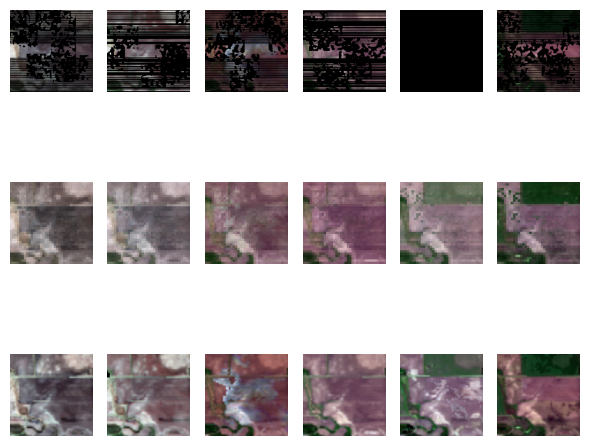

Epoch 82, Train loss.: 5.8060e-01
val_loss: 0.4431755840778351, mse: 0.007146333654721578, sam: 0.1475380708773931, psnr: 22.042171478271484, ssim: 0.559541228680002
Epoch 83, Train loss.: 5.7887e-01
val_loss: 0.45388980706532794, mse: 0.007412905028710763, sam: 0.1505002280076345, psnr: 21.920732498168945, ssim: 0.5571152761410842


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0790013..1.026973].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.051813785..1.0855172].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021825423..0.9161842].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048122633..0.8264015].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016913295..0.99060816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.080049604..0.57656735].


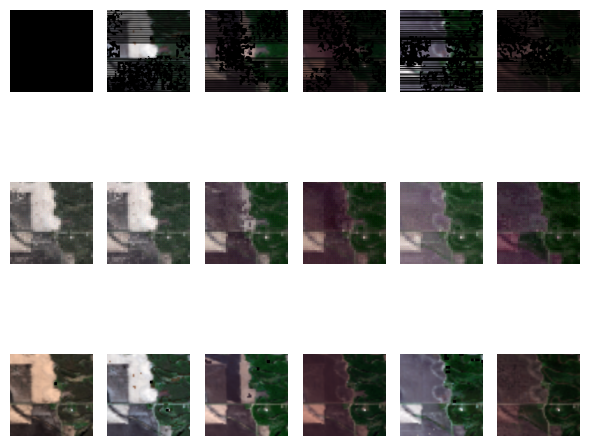

Epoch 84, Train loss.: 5.8406e-01
val_loss: 0.4429844816525777, mse: 0.0071251339589556055, sam: 0.14723995824654898, psnr: 22.047077814737957, ssim: 0.5619046115452848


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055733897..0.9467095].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.039820172..0.9678652].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030330032..0.94195825].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0658443..0.9964807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048161052..0.7781822].


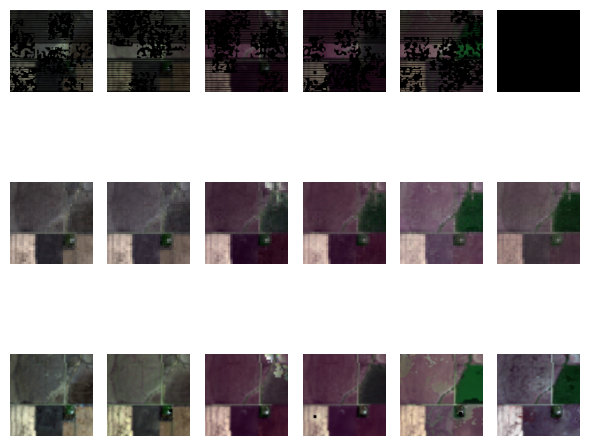

Epoch 85, Train loss.: 5.8049e-01
Model saved at epoch 85
val_loss: 0.4430763324101766, mse: 0.007124077839155992, sam: 0.14772569636503854, psnr: 22.000759760538738, ssim: 0.5576538647064541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0018261825..0.876629].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021712763..0.9036928].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09692401..0.88310266].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0042882403..0.66926104].


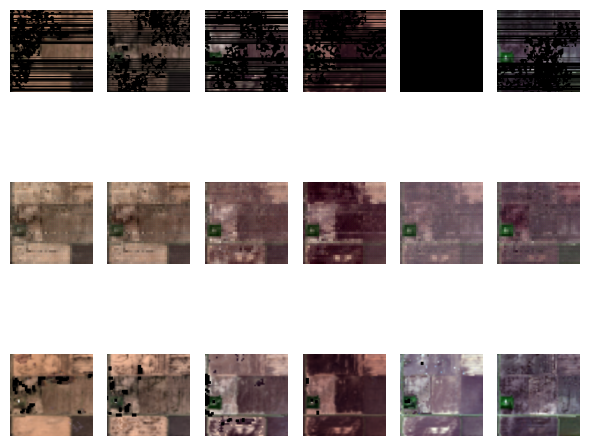

Epoch 86, Train loss.: 5.8754e-01
val_loss: 0.4466005067030589, mse: 0.007341317522029082, sam: 0.14812801281611124, psnr: 21.983879725138348, ssim: 0.5581392355374355
Epoch 87, Train loss.: 5.7797e-01
val_loss: 0.451142152150472, mse: 0.0073115175279478235, sam: 0.1497843861579895, psnr: 21.97313626607259, ssim: 0.5544191892324157
Epoch 88, Train loss.: 5.7649e-01
val_loss: 0.45312931140263873, mse: 0.007327067665755749, sam: 0.15058936178684235, psnr: 21.989315668741863, ssim: 0.5589746104668664


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013362075..0.8275367].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09831637..0.78690237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.078286245..0.6384453].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10296428..0.554925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09125293..0.5530564].


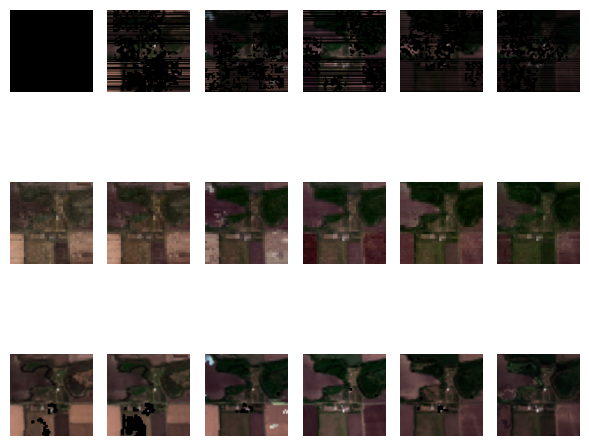

Epoch 89, Train loss.: 5.8658e-01
val_loss: 0.4549162785212199, mse: 0.00736322005589803, sam: 0.1511615812778473, psnr: 22.060888290405273, ssim: 0.5618409774660459
Epoch 90, Train loss.: 5.7796e-01
Model saved at epoch 90
val_loss: 0.43473174174626666, mse: 0.00700403843075037, sam: 0.1451068272193273, psnr: 22.02922757466634, ssim: 0.5580433523753113


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.056560785..1.0372252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04718287..1.0410633].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043950886..0.9567942].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052884586..0.98965055].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03430269..1.1146847].


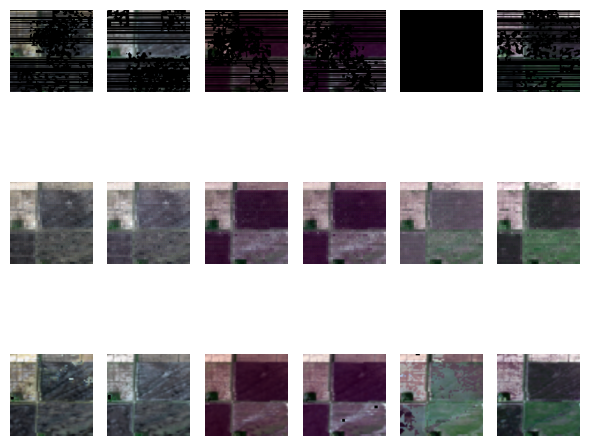

Epoch 91, Train loss.: 5.7582e-01
val_loss: 0.4485976000626882, mse: 0.007276336041589578, sam: 0.1489804486433665, psnr: 21.999526977539062, ssim: 0.5582242654195558
Epoch 92, Train loss.: 5.7604e-01
val_loss: 0.4483531912167867, mse: 0.0071675437502563, sam: 0.14929775396982828, psnr: 22.030545552571613, ssim: 0.5579443634394207


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006979919..1.1237453].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024191724..1.0925581].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010954078..1.0293802].


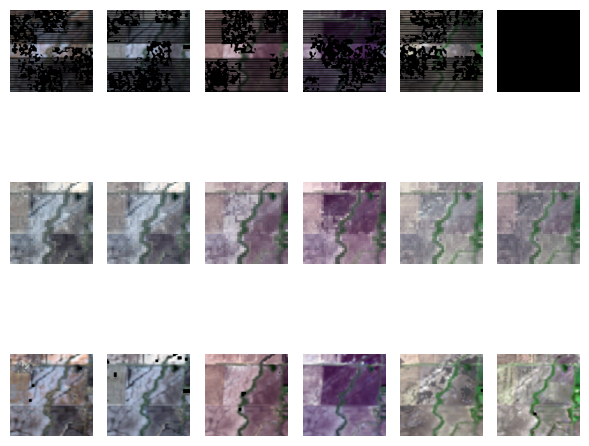

Epoch 93, Train loss.: 5.7395e-01
val_loss: 0.44830434521039325, mse: 0.0071518574841320515, sam: 0.14938190579414368, psnr: 22.064929326375324, ssim: 0.5593520697472228
Epoch 94, Train loss.: 5.7666e-01
val_loss: 0.4420480827490489, mse: 0.007062524401893218, sam: 0.14718381067117056, psnr: 22.102391560872395, ssim: 0.5580168955514244


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008502648..0.95004946].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031862848..0.9360195].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06767844..0.82131165].


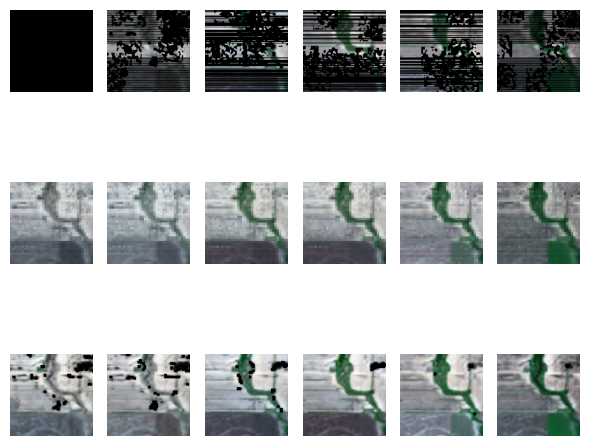

Epoch 95, Train loss.: 5.7459e-01
Model saved at epoch 95
val_loss: 0.44664103786150616, mse: 0.00719253517066439, sam: 0.1488117774327596, psnr: 21.986101786295574, ssim: 0.5557282352303292


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05591744..1.0383068].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07363359..0.8980013].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10008837..0.9613956].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010370036..0.86502075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04351632..0.74003285].


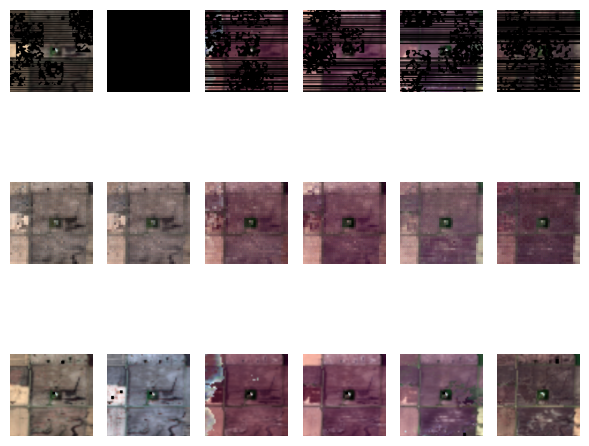

Epoch 96, Train loss.: 5.7258e-01
val_loss: 0.45867546399434406, mse: 0.007401841226965189, sam: 0.1522448112567266, psnr: 22.03649075826009, ssim: 0.5559486839295148
Epoch 97, Train loss.: 5.7394e-01
val_loss: 0.441345751285553, mse: 0.006846022016058366, sam: 0.1472294976313909, psnr: 22.228127161661785, ssim: 0.5622694834281342


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027837813..0.7972524].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044160057..0.7404224].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07653317..0.57644403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031144863..0.6132189].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07808526..0.6253901].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.041321352..0.7909073].


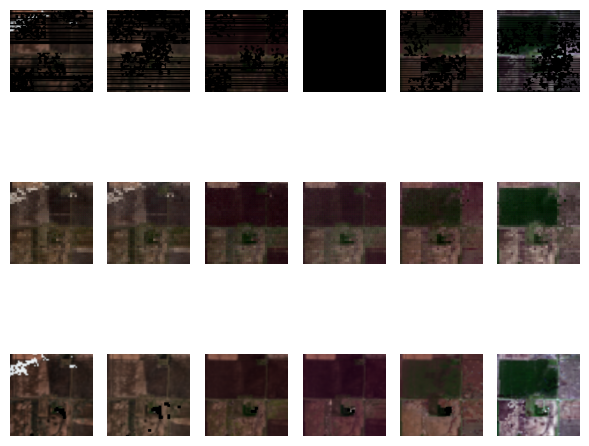

Epoch 98, Train loss.: 5.7528e-01
val_loss: 0.4438590506712596, mse: 0.0071940381700793905, sam: 0.14765155812104544, psnr: 21.974241892496746, ssim: 0.5549975573889451


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.072119..1.0506272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05914708..1.0533376].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012356716..1.038155].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11708533..1.0121713].


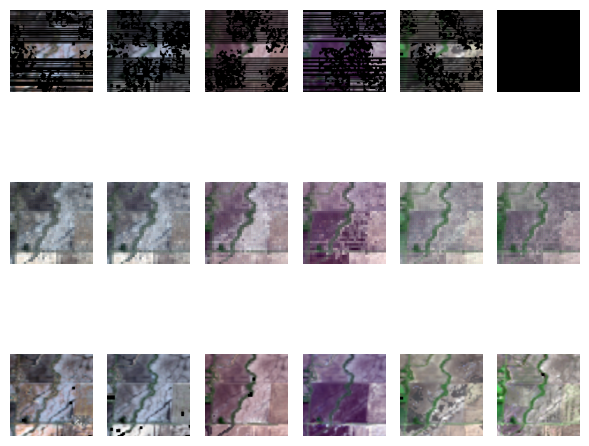

Epoch 99, Train loss.: 5.7466e-01
val_loss: 0.4459698796272278, mse: 0.00709355032692353, sam: 0.14817276100317636, psnr: 22.159857432047527, ssim: 0.5622533367647743


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06502136..1.0271797].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.023645721..1.0369854].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06059894..0.85099393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047887467..1.0024455].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03031085..1.0271118].


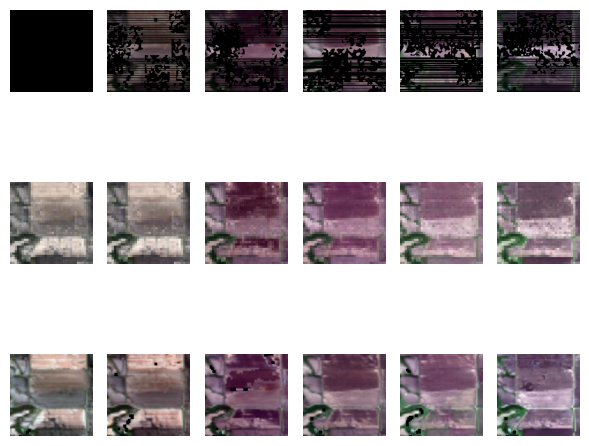

Epoch 100, Train loss.: 5.7461e-01
Model saved at epoch 100


In [5]:
# --------------------------------------------------------------------
# Start to train the model
# --------------------------------------------------------------------

# Initialize TensorBoard writer
writer = SummaryWriter(log_dir=log_dir)

for epoch in range(0, epoch_max):  # loop over the dataset multiple times
    model.train()
    train_loss = 0.0

    for i, data in enumerate(trainloader):
        inputs, targets, cloud_mask, added_cloud_mask, cls_targets, _ = data
        channel_each = inputs.shape[1] // time_span
        last_time_start = channel_each * (time_span - 1)
        last_time_end = channel_each * time_span
        optimizerG.zero_grad()

        outputs = model(inputs.to(device))
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.repeat_interleave(
            model.net.in_chans // time_span, dim=1
        )
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)

        valid_pixels_total = cloud_mask.sum()
        valid_pixel_counts = cloud_mask.sum(dim=(0, 2, 3))
        max_valid_pixel_index = np.argmax(valid_pixel_counts)

        B, TC, H, W = masked_outputs.shape
        T = TC // C

        if if_SAR:
            masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
            masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

            masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
            masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

            masked_outputs_reduced = masked_outputs_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_targets_reduced = masked_targets_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_outputs = masked_outputs_reduced
            masked_targets = masked_targets_reduced

        if valid_pixels_total > 0:
            loss = criterion(
                masked_outputs.to(device),
                masked_targets.to(device),
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            model.parameters(), max_norm=1, norm_type=1, error_if_nonfinite=True
        )
        optimizerG.step()
        train_loss += loss.item()

    writer.add_scalar("Loss/Train", train_loss, epoch)

    model.eval()
    val_loss = 0.0
    mse, sam, psnr, ssim = 0, 0, 0, 0

    with torch.no_grad():
        for inputs, targets, cloud_mask, added_cloud_mask, _, _ in valloader:
            outputs = model(inputs.to(device))

            # Apply cloud mask to outputs and targets
            expanded_cloud_mask = cloud_mask.repeat_interleave(
                model.net.in_chans // time_span, dim=1
            )
            masked_outputs = outputs * expanded_cloud_mask.to(device)
            masked_targets = targets.to(device) * expanded_cloud_mask.to(device)
            B, TC, H, W = masked_outputs.shape
            T = TC // C

            if if_SAR:
                masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
                masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

                masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
                masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

                masked_outputs_reduced = masked_outputs_reduced.reshape(
                    B, T * (C - 2), H, W
                )
                masked_targets_reduced = masked_targets_reduced.reshape(
                    B, T * (C - 2), H, W
                )
                masked_outputs = masked_outputs_reduced
                masked_targets = masked_targets_reduced

            # Compute validation loss
            valid_pixels_total = cloud_mask.sum()
            if valid_pixels_total > 0:
                loss = criterion(
                    masked_outputs.to(device),
                    masked_targets.to(device),
                )
            else:
                loss = torch.tensor(0.0, device=device, requires_grad=False)

            val_loss += loss.item()

            # Compute additional metrics
            masked_outputs_np = masked_outputs.cpu().numpy()
            masked_targets_np = masked_targets.cpu().numpy()

            mse += mean_squared_error(
                masked_targets_np.flatten(), masked_outputs_np.flatten()
            )
            sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
            psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
            ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)

        val_loss /= len(valloader)
        mse /= len(valloader) / batch_size
        sam /= len(valloader) / batch_size
        psnr /= len(valloader) / batch_size
        ssim /= len(valloader) / batch_size

    # Log validation loss and metrics to TensorBoard
    writer.add_scalar("Loss/Validation", val_loss, epoch)
    writer.add_scalar("Metrics/MSE", mse, epoch)
    writer.add_scalar("Metrics/SAM", sam, epoch)
    writer.add_scalar("Metrics/PSNR", psnr, epoch)
    writer.add_scalar("Metrics/SSIM", ssim, epoch)

    print(f"val_loss: {val_loss}, mse: {mse}, sam: {sam}, psnr: {psnr}, ssim: {ssim}")

    with torch.no_grad():
        random_indices = random.sample(range(0, 5), 1)
        for i, (inputs, targets, cloud_mask, cloud_mask_added, _, _) in enumerate(
            valloader
        ):
            if i in random_indices:
                outputs = model(inputs.to(device)).cpu()

                input_images, _ = create_time_series_pseudo_color_image(
                    inputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                output_images, _ = create_time_series_pseudo_color_image(
                    outputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                targets_images, _ = create_time_series_pseudo_color_image(
                    targets[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )

                all_images = [
                    input_images,
                    output_images,
                    targets_images,
                ]

                fig, axes = plt.subplots(
                    len(all_images), len(targets_images), figsize=(6, 6)
                )

                for i, image_list in enumerate(all_images):
                    for j in range(len(image_list)):
                        axes[i][j].imshow(image_list[j])
                        axes[i][j].axis("off")

                plt.tight_layout()
                plt.show()
                break

    scheduler.step()
    train_hist.append(train_loss / len(trainloader))
    save_model(path, model, train_hist, optimizerG, scheduler=scheduler)
    print("Epoch {}, Train loss.: {:0.4e}".format(epoch + 1, train_hist[-1]))
    if (epoch + 1) % 5 == 0:
        save_model(
            path, model, train_hist, optimizerG, scheduler=scheduler, epoch=epoch
        )
        print(f"Model saved at epoch {epoch + 1}")

## Validation Procedure

In [7]:
# To BE DONE

import torch
from tqdm import tqdm
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"

if_write = False
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}"
path = log_dir
val_path = "/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR_2021/output_patches_time_series_with_city"
checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250108-121717_reconstruction"
checkpoint_path = f"{checkpoint_base_folder}/{training_model_folder}/checkpoint_100.pth"
outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
inputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_inputs"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"


val_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=False,
    add_random_time_mask=False,
    val_path=val_path,
)

valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)


checkpoint = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(checkpoint["model_state_dict"])

# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# epoch = checkpoint['epoch']

print("Checkpoint loaded successfully!")

/tmp/ipykernel_4000789/1220824914.py:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Checkpoint loaded successfully!


In [8]:
def write_tiff(output_path, image):
    if image.ndim == 2:
        image = image[np.newaxis, ...]

    bands, height, width = image.shape

    driver = gdal.GetDriverByName("GTiff")
    dataset = driver.Create(
        output_path,
        width,
        height,
        bands,
        gdal.GDT_Float32,
    )

    if dataset is None:
        raise RuntimeError(f"Unable to create TIFF file: {output_path}")

    # Write each band to the dataset
    for i in range(bands):
        band = dataset.GetRasterBand(i + 1)
        band.WriteArray(image[i, :, :])
        band.FlushCache()  # Ensure data is written to disk

    dataset = None

In [9]:
model.eval()
val_loss = 0.0
mse, sam, psnr, ssim = 0, 0, 0, 0

if if_write:

    os.makedirs(outputs_folder, exist_ok=True)
    os.makedirs(targets_folder, exist_ok=True)
    os.makedirs(inputs_folder, exist_ok=True)
    os.makedirs(cloud_mask_folder, exist_ok=True)


# Start validation
with torch.no_grad():
    # Wrap valloader with tqdm for progress tracking
    for batch_idx, (
        inputs,
        targets,
        cloud_mask,
        added_cloud_mask,
        cls_targets,
        file_name,
    ) in enumerate(tqdm(valloader, desc="Validation Progress")):
        outputs = model(inputs.to(device))
        expanded_cloud_mask = cloud_mask.repeat_interleave(
            model.net.in_chans // time_span, dim=1
        )
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)
        B, TC, H, W = masked_outputs.shape
        T = TC // C

        if if_SAR:
            masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
            masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

            masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
            masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

            masked_outputs_reduced = masked_outputs_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_targets_reduced = masked_targets_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_outputs = masked_outputs_reduced
            masked_targets = masked_targets_reduced

        # Compute validation loss
        valid_pixels_total = cloud_mask.sum()
        if valid_pixels_total > 0:
            loss = criterion(
                masked_outputs.to(device),
                masked_targets.to(device),
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=False)

        val_loss += loss.item()

        # Save as NumPy arrays
        if if_write:
            for i in range(B):  # Process each item in the batch
                base_filename = os.path.splitext(file_name[i])[0]
                output_filename = os.path.join(
                    outputs_folder, f"{base_filename}_output.tiff"
                )
                target_filename = os.path.join(
                    targets_folder, f"{base_filename}_target.tiff"
                )
                input_filename = os.path.join(
                    inputs_folder, f"{base_filename}_input.tiff"
                )
                cloud_mask_filename = os.path.join(
                    cloud_mask_folder, f"{base_filename}_cloud_mask.tiff"
                )

                write_tiff(output_path=target_filename, image=targets[i].cpu().numpy())
                write_tiff(output_path=output_filename, image=outputs[i].cpu().numpy())
                write_tiff(output_path=input_filename, image=inputs[i].cpu().numpy())
                write_tiff(
                    output_path=cloud_mask_filename, image=cloud_mask[i].cpu().numpy()
                )
        # Compute additional metrics
        masked_outputs_np = masked_outputs.cpu().numpy()
        masked_targets_np = masked_targets.cpu().numpy()

        mse += mean_squared_error(
            masked_targets_np.flatten(), masked_outputs_np.flatten()
        )
        sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
        psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
        ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)
        current_ssim = structural_similarity_index(masked_targets_np, masked_outputs_np)
        ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)

    val_loss /= len(valloader)
    mse /= len(valloader) / batch_size
    sam /= len(valloader) / batch_size
    psnr /= len(valloader) / batch_size
    ssim /= len(valloader) / batch_size

    print(
        f"Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}"
    )

Validation Progress: 100%|██████████| 51/51 [07:54<00:00,  9.31s/it]

Validation Loss: 1.1606, MSE: 0.5405, SAM: 7.3726, PSNR: 340.9033, SSIM: 15.0990


In [14]:
import torch
from tqdm import tqdm
import os

# --------------------------------------------------------------------
# Importing required libraries
# --------------------------------------------------------------------
import random
import numpy as np
import pandas as pd
import PIL.Image as Image
from glob import glob
from mymodels import (
    ReconNet,
    VisionTransformerTimeSeriesFormalizedWithSAR,
)
from mymodels.unet import Unet
from mymodels.discriminatorv2 import Discriminator
import matplotlib.pyplot as plt
from myutils import imshow
from datetime import datetime

# importing pytorch functions
import torch
from torchvision.utils import make_grid
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as tvtransforms
from torch.nn import SmoothL1Loss, BCELoss

# importing utils required in th code
from utils import subsample
from utils import transforms
from utils.evaluate import ssim, psnr, nmse
from utils.losses import (
    SSIMLoss,
    SSIMLoss_V1,
    MultiScaleLoss,
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)
from utils.process import transform_tensor_image, RealisticCloudMaskFunc
from osgeo import gdal
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import mean_squared_error
import math

# Device
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
# device = 'cuda'
# np.random.seed(42)
# random.seed(42)

print("******* STARTED AT ************", datetime.now())


def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"

checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250108-121717_reconstruction"

outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"


def compute_metrics(targets_folder, outputs_folder):
    """Compute MSE, SAM, PSNR, and SSIM for images in the specified folders."""
    mse_total, sam_total, psnr_total, ssim_total = 0, 0, 0, 0
    file_list = [
        file_name
        for file_name in os.listdir(targets_folder)
        if file_name.endswith(".tiff")
    ]
    num_files = len(file_list)

    if num_files == 0:
        raise ValueError("No valid files found for metric computation.")

    # Iterate through files with a progress bar
    for file_name in tqdm(file_list, desc="Computing metrics", total=num_files):
        base_name, ext = os.path.splitext(file_name)
        base_name = base_name.replace("target", "")

        target_path = os.path.join(targets_folder, f"{base_name}target.tiff")
        output_path = os.path.join(outputs_folder, f"{base_name}output.tiff")

        # Read images
        target = read_tiff(target_path)
        output = read_tiff(output_path)
        target = np.expand_dims(target, axis=0)
        output = np.expand_dims(output, axis=0)

        mse_total += mean_squared_error(target.flatten(), output.flatten())
        sam_total += spectral_angle_mapper_numpy(output, target)
        psnr_total += peak_signal_to_noise_ratio(target, output)
        ssim_total += structural_similarity_index(
            target, output
        )  # Assuming multichannel images

    # Compute averages
    mse_avg = mse_total / num_files
    sam_avg = sam_total / num_files
    psnr_avg = psnr_total / num_files
    ssim_avg = ssim_total / num_files

    return mse_avg, sam_avg, psnr_avg, ssim_avg


# Compute and print metrics
mse, sam, psnr, ssim = compute_metrics(targets_folder, outputs_folder)
print(f"MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}")

******* STARTED AT ************ 2025-01-08 16:34:52.573944


Computing metrics: 100%|██████████| 1014/1014 [02:28<00:00,  6.81it/s]

MSE: 0.0373, SAM: 0.4281, PSNR: 15.2798, SSIM: 0.3001


In [1]:
import os
import numpy as np
from tqdm import tqdm
from sklearn.metrics import mean_squared_error
from osgeo import gdal
from utils.losses import (
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)


# Device
device = "cpu"  # No need for GPU as we're only using numpy


def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250108-121717_reconstruction"

outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"

if_SAR = True


def compute_metrics(targets_folder, outputs_folder, cloud_mask_folder):
    """Compute MSE, SAM, PSNR, and SSIM for images in the specified folders."""
    mse_total, sam_total, psnr_total, ssim_total = 0, 0, 0, 0
    file_list = [
        file_name
        for file_name in os.listdir(targets_folder)
        if file_name.endswith(".tiff")
    ]
    num_files = len(file_list)

    if num_files == 0:
        raise ValueError("No valid files found for metric computation.")

    # Iterate through files with a progress bar
    for file_name in tqdm(file_list, desc="Computing metrics", total=num_files):
        base_name, ext = os.path.splitext(file_name)
        base_name = base_name.replace("target", "")

        target_path = os.path.join(targets_folder, f"{base_name}target.tiff")
        output_path = os.path.join(outputs_folder, f"{base_name}output.tiff")
        cloud_path = os.path.join(cloud_mask_folder, f"{base_name}cloud_mask.tiff")

        # Read images
        target = read_tiff(target_path)
        output = read_tiff(output_path)
        cloud_mask = read_tiff(cloud_path)

        target = np.expand_dims(target, axis=0)
        output = np.expand_dims(output, axis=0)
        cloud_mask = np.expand_dims(cloud_mask, axis=0)

        expanded_cloud_mask = np.repeat(
            cloud_mask, target.shape[1] // cloud_mask.shape[1], axis=1
        )
        masked_outputs = output * expanded_cloud_mask
        masked_targets = target * expanded_cloud_mask

        if if_SAR:
            masked_outputs = masked_outputs[:, : masked_outputs.shape[1] - 2, :, :]
            masked_targets = masked_targets[:, : masked_targets.shape[1] - 2, :, :]

        # Compute metrics
        target = masked_targets.astype(np.float32)
        output = masked_outputs.astype(np.float32)

        mse_total += mean_squared_error(target.flatten(), output.flatten())
        sam_total += spectral_angle_mapper_numpy(output, target)
        psnr_total += peak_signal_to_noise_ratio(target, output)
        ssim_total += structural_similarity_index(
            target, output
        )  # Assuming multichannel images

    # Compute averages
    mse_avg = mse_total / num_files
    sam_avg = sam_total / num_files
    psnr_avg = psnr_total / num_files
    ssim_avg = ssim_total / num_files

    return mse_avg, sam_avg, psnr_avg, ssim_avg


# Compute and print metrics
mse, sam, psnr, ssim = compute_metrics(
    targets_folder, outputs_folder, cloud_mask_folder
)
print(f"MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}")

Computing metrics: 100%|██████████| 1014/1014 [02:50<00:00,  5.95it/s]

MSE: 0.0272, SAM: 0.3723, PSNR: 17.0054, SSIM: 0.3735
